 <font size="15">
SKT002.01_scATAC_HumanPancreas_Chiou_NatGen_ArchR_DataIntegration
 </font> 

# Libraries and Functions

In [1]:
library(ArchR)
set.seed(1234)
library(parallel)


Loading required package: ggplot2

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats

In [2]:
library(ArchR)
library(parallel)
set.seed(1234)
library(tidyverse)
library(magick)

Warning message:
“‘timedatectl’ indicates the non-existent timezone name ‘n/a’”
Warning message:
“Your system is mis-configured: ‘/etc/localtime’ is not a symlink”
Warning message:
“It is strongly recommended to set envionment variable TZ to ‘Europe/Amsterdam’ (or equivalent)”
── Attaching packages ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ tibble  3.1.7     ✔ dplyr   1.0.8
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1
✔ purrr   0.3.4     

── Conflicts ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()         masks data.table::between()
✖ dplyr::collapse()        masks IRanges::collapse()
✖ dplyr::combine()         masks Biobase::combine(), BiocGenerics::combine()
✖ dplyr::count()  

In [3]:
sessionInfo()

R version 4.1.1 (2021-08-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Rocky Linux 8.9 (Green Obsidian)

Matrix products: default
BLAS/LAPACK: /vsc-hard-mounts/leuven-data/332/vsc33293/miniconda/envs/R_Seurat/lib/libopenblasp-r0.3.18.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] magick_2.7.3                forcats_0.5.1              
 [3] stringr_1.4.0               dplyr_1.0.8                
 [5] purrr_0.3.4                 readr_2.1.2                
 [7] tidyr_1.2.0                 tibble_3.1.7        

## Function Figure Size

In [4]:
# function for adjusting width and height of plots

fig <- function(width, height){
     options(repr.plot.width = width, repr.plot.height = height)
}

# Input Data

In [5]:
# Directories
ProjectDir <- '/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/'

ChiouNatGen_T2D <- paste0(ProjectDir, "Chiou.et.al.2021_NatureGenetics_T2D/")
ChiouNatGen_T2D_DATA_Dir <- paste0(ChiouNatGen_T2D, "OUTPUTDIR/")


RDS_Dir <- paste0(ProjectDir, "RDS/")
FIG_Dir <- paste0(ProjectDir, "Figure/")
DATA_Dir <- paste0(ProjectDir, "Data/")

In [6]:
# ArchRdirectory
ArchRdir <- "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10/"
setwd(ArchRdir)

In [7]:
list.files(ArchRdir)

[1] "Annotations"                     "ArchRLogs"                      
 [3] "ArrowFiles"                      "ChiouNatGen_Islet1.arrow"       
 [5] "ChiouNatGen_Islet2.arrow"        "ChiouNatGen_Islet3.arrow"       
 [7] "ChiouNatGen_WholePanc_10X.arrow" "ChiouNatGen_WholePanc_CB.arrow" 
 [9] "Embeddings"                      "EnrichedTF-AcinarCells.csv"     
[11] "GeneMarkersC8.csv"               "GroupCoverages"                 
[13] "ImputeWeights"                   "IterativeLSI"                   
[15] "PeakCalls"                       "Plots"                          
[17] "QualityControl"                  "RNAIntegration"                 
[19] "Save-ArchR-Project.rds"          "tmp"

## Load ArchR Project

In [8]:
proj <- loadArchRProject(path = ArchRdir)

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [9]:
addArchRThreads(threads = 18) 

Setting default number of Parallel threads to 18.



In [10]:
proj


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(30): Sample TSSEnrichment ... predictedGroup_Un
  predictedScore_Un
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

# Setup ArchR

In [ ]:
addArchRGenome("Hg38")

Setting default genome to Hg38.



# Create Arrow Files

In [ ]:
# Input files
pathToPancreasIslet1 <- paste0(ChiouNatGen_T2D_DATA_Dir, 'SRR12957013/')
pathToPancreasIslet2 <- paste0(ChiouNatGen_T2D_DATA_Dir, 'SRR12957014/')
pathToPancreasIslet3 <- paste0(ChiouNatGen_T2D_DATA_Dir, 'SRR12957015/')
pathToWholePancreas_CB <- paste0(ChiouNatGen_T2D_DATA_Dir, 'SRR12957016/')
pathToWholePancreas_10X <- paste0(ChiouNatGen_T2D_DATA_Dir, 'ChiouNatGen_WholePancreas/outs/')

scATACHg38PancreasIslet1 <- paste0(pathToPancreasIslet1, 'fragments.sort.bed.gz')
scATACHg38PancreasIslet2 <- paste0(pathToPancreasIslet2, 'fragments.sort.bed.gz')
scATACHg38PancreasIslet3 <- paste0(pathToPancreasIslet3, 'fragments.sort.bed.gz')
scATACHg38WholePancreas_CB <- paste0(pathToWholePancreas_CB, 'fragments.sort.bed.gz')
scATACHg38WholePancreas_10X <- paste0(pathToWholePancreas_10X, 'fragments.tsv.gz')

In [ ]:
ArrowFiles <- createArrowFiles(
  inputFiles = c(scATACHg38PancreasIslet1, scATACHg38PancreasIslet2, scATACHg38PancreasIslet3, scATACHg38WholePancreas_CB, scATACHg38WholePancreas_10X),
  sampleNames = c("ChiouNatGen_Islet1", 'ChiouNatGen_Islet2', 'ChiouNatGen_Islet3', 'ChiouNatGen_WholePanc_CB', 'ChiouNatGen_WholePanc_10X'),
  minTSS = 10, #Dont set this too high because you can always increase later
  minFrags = 1000, 
  addTileMat = TRUE,
  addGeneScoreMat = TRUE,
 #threads = 18
)

Using GeneAnnotation set by addArchRGenome(Hg38)!

Using GeneAnnotation set by addArchRGenome(Hg38)!

ArchR logging to : ArchRLogs/ArchR-createArrows-7c7126144b4d-Date-2022-05-10_Time-17-33-58.log
If there is an issue, please report to github with logFile!

Cleaning Temporary Files

2022-05-10 17:33:59 : Batch Execution w/ safelapply!, 0 mins elapsed.



In [ ]:
ArrowFiles

[1] "ChiouNatGen_Islet3.arrow" "ChiouNatGen_Islet1.arrow"

# Inferring Doublets

In [ ]:
doubScores <- addDoubletScores(
  input = ArrowFiles,
  k = 10, #Refers to how many cells near a "pseudo-doublet" to count.
  knnMethod = "UMAP", #Refers to the embedding to use for nearest neighbor search with doublet projection.
  LSIMethod = 1
)

ArchR logging to : ArchRLogs/ArchR-addDoubletScores-5ece321b90a2-Date-2022-05-10_Time-16-42-04.log
If there is an issue, please report to github with logFile!

2022-05-10 16:42:05 : Batch Execution w/ safelapply!, 0 mins elapsed.

2022-05-10 16:42:05 : ChiouNatGen_Islet3 (1 of 2) :  Computing Doublet Statistics, 0.001 mins elapsed.



# Creating an ArchRProject

In [ ]:
proj <- ArchRProject(
  ArrowFiles = ArrowFiles, 
  outputDirectory = ArchRdir,
  copyArrows = TRUE #This is recommened so that you maintain an unaltered copy for later usage.
)

In [ ]:
proj

In [ ]:
# memory size of the ArchRProject
paste0("Memory Size = ", round(object.size(proj) / 10^8, 3), " MB")

## Copying ArchRProject

In [ ]:
# copying existing ArchRProject ot a new output directory
saveArchRProject(
  ArchRProj = proj,
  outputDirectory = ArchRdir
)

Copying ArchRProject to new outputDirectory : /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10

Copying Arrow Files...

Copying Arrow Files (1 of 5)

Copying Arrow Files (2 of 5)

Copying Arrow Files (3 of 5)

Copying Arrow Files (4 of 5)

Copying Arrow Files (5 of 5)

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 12): ArchRLogs

Copying Other Files (2 of 12): ChiouNatGen_Islet1.arrow

Copying Other Files (3 of 12): ChiouNatGen_Islet2.arrow

Copying Other Files (4 of 12): ChiouNatGen_Islet3.arrow

Copying Other Files (5 of 12): ChiouNatGen_WholePanc_10X.arrow

Copying Other Files (6 of 12): ChiouNatGen_WholePanc_CB.arrow

Copying Other Files (7 of 12): Embeddings

Copying Other Files (8 of 12): IterativeLSI

Copying Other Files (9 of 12): Plots

Copying Other Files (10 of 12): QualityControl

Copying Other Files (11 of 12): RNAIntegration

Copying Other Files (12 of 12): tmp

Warning message in file.copy(

class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ...
  predictedGroup_Unconstrained predictedScore_Unconstrained
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

# Subsetting cells: Minimum TSS enrichment of 10

In [ ]:
idxPass <- which(proj$TSSEnrichment >= 10)
cellsPass <- proj$cellNames[idxPass]
projsubset <- proj[cellsPass, ]

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!



In [ ]:
table(proj$Sample)



       ChiouNatGen_Islet1        ChiouNatGen_Islet2        ChiouNatGen_Islet3 
                     4758                      3881                      5069 
ChiouNatGen_WholePanc_10X  ChiouNatGen_WholePanc_CB 
                    23433                      2908 

In [ ]:
table(proj$Sample)



       ChiouNatGen_Islet1        ChiouNatGen_Islet2        ChiouNatGen_Islet3 
                     4758                      3881                      5069 
ChiouNatGen_WholePanc_10X  ChiouNatGen_WholePanc_CB 
                    23433                      2908 

In [ ]:
table(projsubset$Sample)



       ChiouNatGen_Islet1        ChiouNatGen_Islet2        ChiouNatGen_Islet3 
                     4702                      3852                      5016 
ChiouNatGen_WholePanc_10X  ChiouNatGen_WholePanc_CB 
                    11913                      2655 

In [ ]:
idxPass <- which(proj$TSSEnrichment >= 10)
cellsPass <- proj$cellNames[idxPass]
proj <- proj[cellsPass, ]

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!



# Plotting QC metrics

In [ ]:
#  TSS Enrichment score for each cells
quantile(proj$TSSEnrichment)

0%      25%      50%      75%     100% 
10.00000 12.88800 16.80000 20.26175 61.78200

## TSS enrichment score vs Number of unique fragments

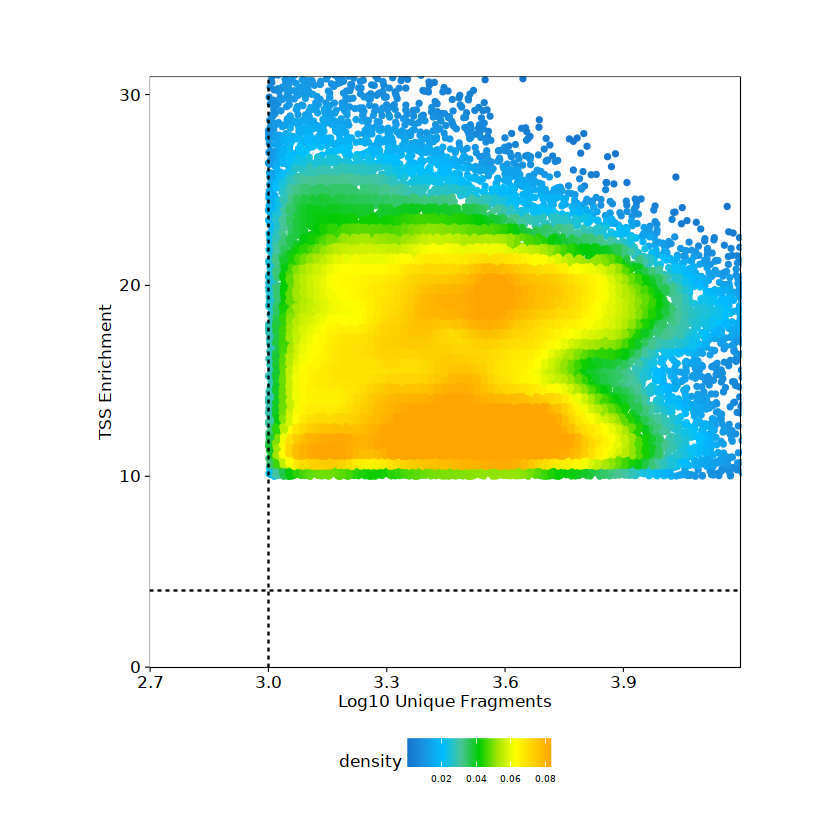

In [ ]:
# Retrieve data from the metadata columns such as number of unique nuclear fragments and tss enrichment score

df <- getCellColData(proj, select = c("log10(nFrags)", "TSSEnrichment"))


TSS_VS_Frags <- ggPoint(
    x = df[,1], 
    y = df[,2], 
    colorDensity = TRUE,
    continuousSet = "sambaNight",
    xlabel = "Log10 Unique Fragments",
    ylabel = "TSS Enrichment",
    xlim = c(log10(500), quantile(df[,1], probs = 0.99)),
    ylim = c(0, quantile(df[,2], probs = 0.99))
) + geom_hline(yintercept = 4, lty = "dashed") + geom_vline(xintercept = 3, lty = "dashed")

TSS_VS_Frags

In [ ]:
setwd(ArchRdir)
plotPDF(TSS_VS_Frags, name = "TSS-vs-Frags.pdf", ArchRProj = proj, addDOC = FALSE)

Plotting Ggplot!



1 
Warning message:
“`expand_scale()` is deprecated; use `expansion()` instead.”


1 


Picking joint bandwidth of 0.869

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”


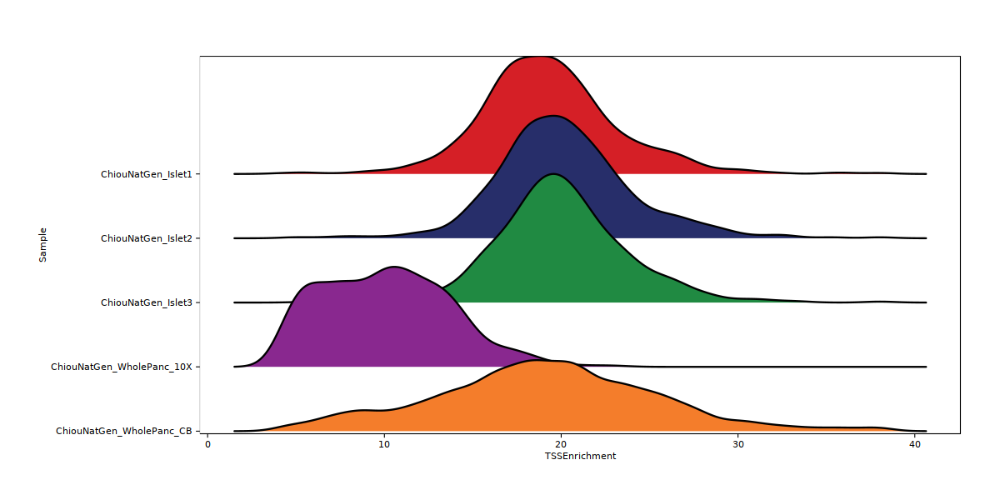

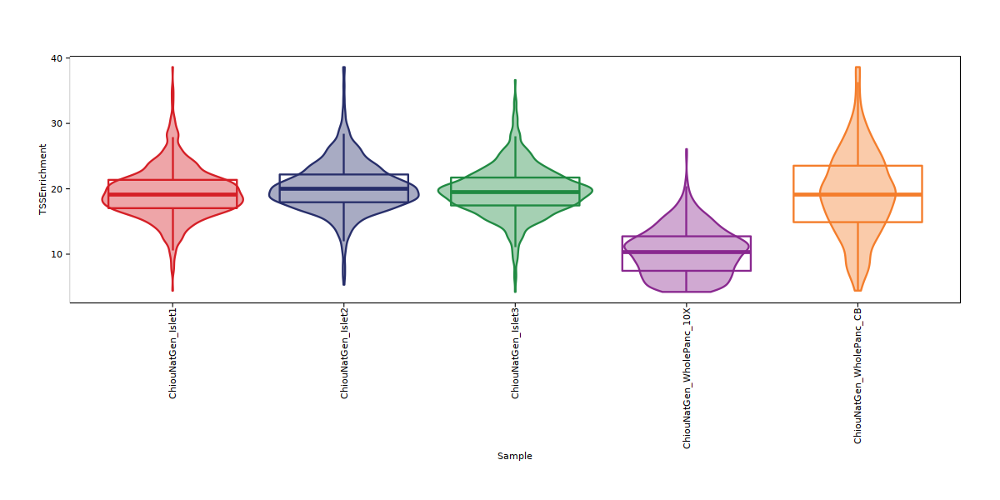

In [ ]:
# TSS enrichment score

fig(10,5)

p1 <- plotGroups(
    ArchRProj = proj, 
    groupBy = "Sample", 
    colorBy = "cellColData",
    name = "TSSEnrichment",
    plotAs = "ridges"
   )

p2 <- plotGroups(
    ArchRProj = proj, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )

p1
p2

1 
Warning message:
“`expand_scale()` is deprecated; use `expansion()` instead.”


1 


Picking joint bandwidth of 0.0616

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”


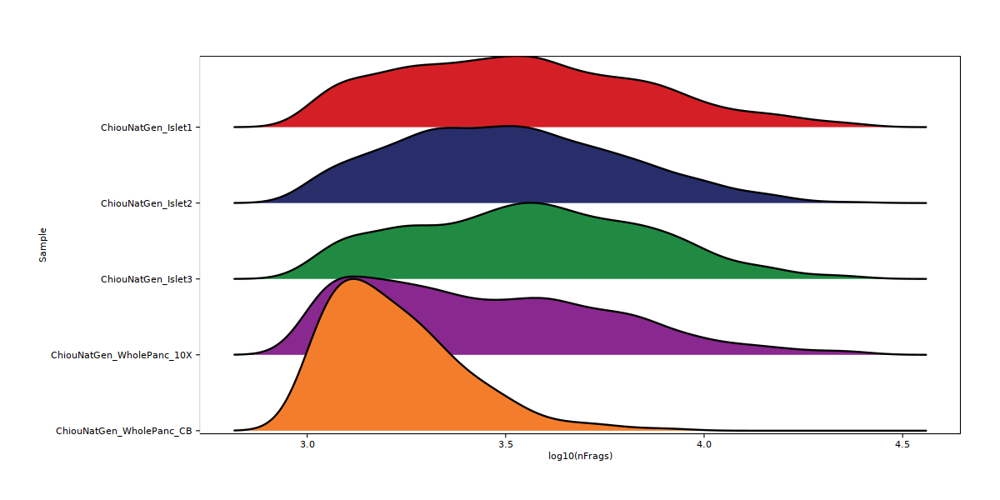

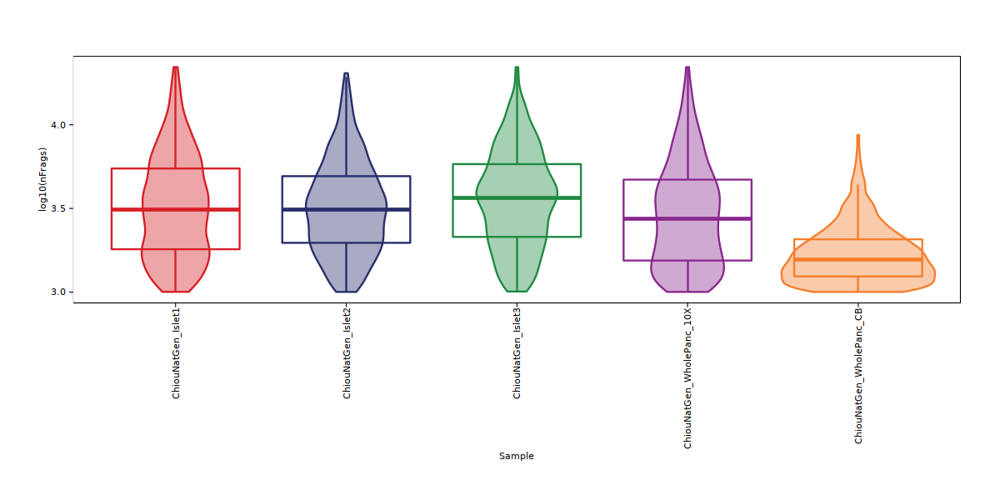

In [ ]:
# Number of unique fragments

p3 <- plotGroups(
    ArchRProj = proj, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "log10(nFrags)",
    plotAs = "ridges"
   )

p4 <- plotGroups(
    ArchRProj = proj, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "log10(nFrags)",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )

p3
p4

In [ ]:
plotPDF(p1,p2,p3,p4, name = "QC-Sample-Statistics.pdf", ArchRProj = proj, addDOC = FALSE, width = 4, height = 4)

Plotting Ggplot!

Picking joint bandwidth of 0.869

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Picking joint bandwidth of 0.869

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Plotting Ggplot!

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` t

## Fragment Size Distribution and TSS Enrichment Profiles

ArchR logging to : ArchRLogs/ArchR-plotFragmentSizes-6e0038325acc-Date-2022-05-10_Time-18-00-21.log
If there is an issue, please report to github with logFile!

ArchR logging successful to : ArchRLogs/ArchR-plotFragmentSizes-6e0038325acc-Date-2022-05-10_Time-18-00-21.log



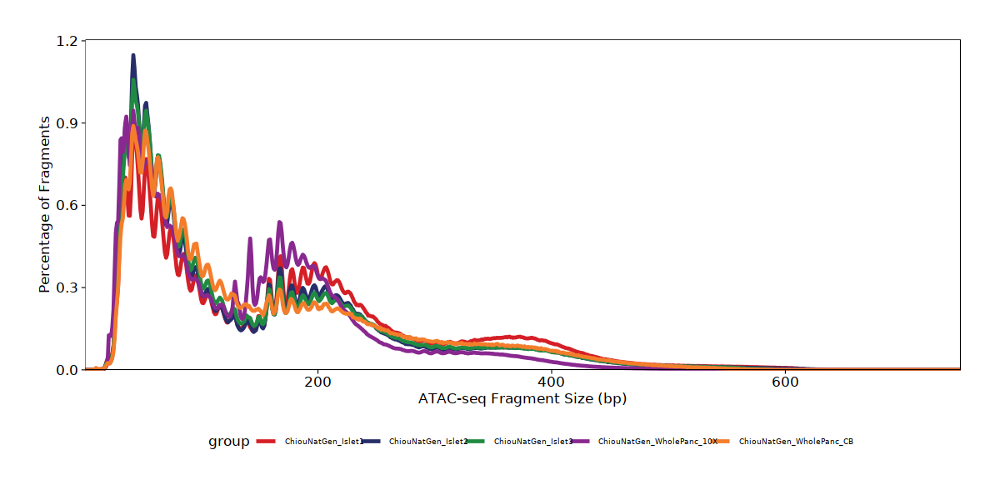

In [ ]:
# Fragment Size
p1 <- plotFragmentSizes(ArchRProj = proj)
p1

ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-6e008ec8aec-Date-2022-05-10_Time-18-02-42.log
If there is an issue, please report to github with logFile!

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-6e008ec8aec-Date-2022-05-10_Time-18-02-42.log



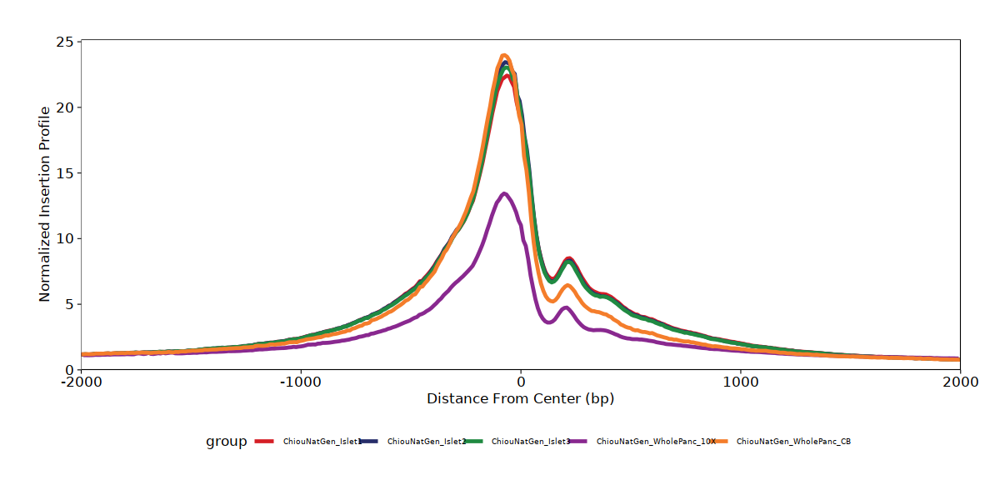

In [ ]:
# TSS Enrichment
p2 <- plotTSSEnrichment(ArchRProj = proj)
p2

In [ ]:
plotPDF(p1,p2, name = "QC-Sample-FragSizes-TSSProfile.pdf", ArchRProj = proj, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!



## Save ArchRProject

In [ ]:
saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ...
  predictedGroup_Unconstrained predictedScore_Unconstrained
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

# Filtering Doublets

In [ ]:
proj <- filterDoublets(ArchRProj = proj)

Filtering 813 cells from ArchRProject!

	ChiouNatGen_WholePanc_10X : 25 of 23458 (0.1%)

	ChiouNatGen_Islet3 : 286 of 5355 (5.3%)

	ChiouNatGen_Islet1 : 250 of 5008 (5%)

	ChiouNatGen_Islet2 : 163 of 4044 (4%)

	ChiouNatGen_WholePanc_CB : 89 of 2997 (3%)



## Save Archr Project

In [ ]:
saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ...
  predictedGroup_Unconstrained predictedScore_Unconstrained
numberOfCells(1): 28138
medianTSS(1): 16.8
medianFrags(1): 2922

# Add Cell Type Annotation Metadata

In [ ]:
List <- c('ChiouNatGen_Islet1', 'ChiouNatGen_Islet2', 'ChiouNatGen_Islet3', 'ChiouNatGen_WholePanc_CB', 'ChiouNatGen_WholePanc_10X')

for (x in List) {
    idxSample <- BiocGenerics::which(proj$Sample %in% x)
cellsSample <- proj$cellNames[idxSample]
 
    print(x)
    print(head(cellsSample, n = 1))
}


[1] "ChiouNatGen_Islet1"
[1] "ChiouNatGen_Islet1#GAGATTCCGCGTAGTAAAGGCTATGTACT"
[1] "ChiouNatGen_Islet2"
[1] "ChiouNatGen_Islet2#CAGTTGCAAAGAGGCATATGCGATCCT"
[1] "ChiouNatGen_Islet3"
[1] "ChiouNatGen_Islet3#CTATTAGGCGAGGCTGCCTAGAGTTATAGCCT"
[1] "ChiouNatGen_WholePanc_CB"
[1] "ChiouNatGen_WholePanc_CB#CAACTCAACGACGTCCGTAATT"
[1] "ChiouNatGen_WholePanc_10X"
[1] "ChiouNatGen_WholePanc_10X#AACCAACAGACCGCAA-1"


In [ ]:
# This is the cluster label downloaded from Chiou et al. 2022 Nature Genetics

ClusterLabel <- read.table(
  file = paste0(ChiouNatGen_T2D,"GSE160472_islet_snATAC.cluster_labels.txt.gz"),
    sep = "\t",
        header = FALSE,
#    row.names = 1,
    col.names = c("CellId","UMAP1", "UMAP2", "ClusterName")
)


In [ ]:
ClusterLabel %>% head

,CellId,UMAP1,UMAP2,ClusterName
,<chr>,<dbl>,<dbl>,<chr>
1,Islet1_AGACACCTAAGAGGCAAAGGAGTAGGCTC,-5.102393,1.3868204,alpha_2
2,Islet1_AGACACCTAAGAGGCAAAGGAGTAGGTTG,2.121361,3.5533817,beta_2
3,Islet1_AGACACCTAAGAGGCAAAGGCTATATAGA,2.089698,10.0695360,immune
4,Islet1_AGACACCTAAGAGGCAACTGCATAGTACT,-9.805659,1.1269126,alpha_1
5,Islet1_AGACACCTAAGAGGCACCTAGAGTAGGCG,8.333635,-0.7190217,beta_1
6,Islet1_AGACACCTAAGAGGCACCTAGAGTGTACT,7.030728,-3.5811422,beta_1


In [ ]:
library(tidyverse)

ClusterLabel$CellId <- ClusterLabel$CellId %>% 
str_replace("Islet1_", "ChiouNatGen_Islet1#") %>%
str_replace("Islet2_", "ChiouNatGen_Islet2#") %>%
str_replace("Islet3_", "ChiouNatGen_Islet3#")


Warning message:
“‘timedatectl’ indicates the non-existent timezone name ‘n/a’”
Warning message:
“Your system is mis-configured: ‘/etc/localtime’ is not a symlink”
Warning message:
“It is strongly recommended to set envionment variable TZ to ‘Europe/Brussels’ (or equivalent)”
── Attaching packages ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ tibble  3.1.6     ✔ dplyr   1.0.8
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1
✔ purrr   0.3.4     

── Conflicts ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::between()         masks data.table::between()
✖ dplyr::collapse()        masks Biostrings::collapse(), IRanges::collapse()
✖ dplyr::combine()         masks gridExt

In [ ]:
ClusterLabel %>% head

,CellId,UMAP1,UMAP2,ClusterName
,<chr>,<dbl>,<dbl>,<chr>
1,ChiouNatGen_Islet1#AGACACCTAAGAGGCAAAGGAGTAGGCTC,-5.102393,1.3868204,alpha_2
2,ChiouNatGen_Islet1#AGACACCTAAGAGGCAAAGGAGTAGGTTG,2.121361,3.5533817,beta_2
3,ChiouNatGen_Islet1#AGACACCTAAGAGGCAAAGGCTATATAGA,2.089698,10.0695360,immune
4,ChiouNatGen_Islet1#AGACACCTAAGAGGCAACTGCATAGTACT,-9.805659,1.1269126,alpha_1
5,ChiouNatGen_Islet1#AGACACCTAAGAGGCACCTAGAGTAGGCG,8.333635,-0.7190217,beta_1
6,ChiouNatGen_Islet1#AGACACCTAAGAGGCACCTAGAGTGTACT,7.030728,-3.5811422,beta_1


In [ ]:
# how many cells are found in our ArchR project that correspond to the list of cells with cell type annotation
length(which(ClusterLabel$CellId %in% getCellNames(proj)))

[1] 12669

In [ ]:
getCellNames(proj) %>% length

[1] 40049

In [ ]:
ClusterLabel$CellId %>% length

[1] 15298

In [ ]:
df1 <- as.data.frame(ClusterLabel$CellId)
colnames(df1) <- 'CellId'
df1 %>% head

,CellId
,<chr>
1,ChiouNatGen_Islet1#AGACACCTAAGAGGCAAAGGAGTAGGCTC
2,ChiouNatGen_Islet1#AGACACCTAAGAGGCAAAGGAGTAGGTTG
3,ChiouNatGen_Islet1#AGACACCTAAGAGGCAAAGGCTATATAGA
4,ChiouNatGen_Islet1#AGACACCTAAGAGGCAACTGCATAGTACT
5,ChiouNatGen_Islet1#AGACACCTAAGAGGCACCTAGAGTAGGCG
6,ChiouNatGen_Islet1#AGACACCTAAGAGGCACCTAGAGTGTACT


In [ ]:
df2 <- as.data.frame(getCellNames(proj))
colnames(df2) <- 'CellId'
df2 %>% head

,CellId
,<chr>
1,ChiouNatGen_WholePanc_10X#AACCAACAGACCGCAA-1
2,ChiouNatGen_WholePanc_10X#CCCTCTCGTACTAGAA-1
3,ChiouNatGen_WholePanc_10X#AATACGCTCGGATAGG-1
4,ChiouNatGen_WholePanc_10X#GCACGCACAATGGTCT-1
5,ChiouNatGen_WholePanc_10X#CCTGGGACAGATTAAG-1
6,ChiouNatGen_WholePanc_10X#CTGTTCGAGCGTATCT-1


In [ ]:
CommonCellId <- inner_join(df1,df2)
CommonCellId %>% nrow

Joining, by = "CellId"


[1] 12669

In [ ]:
CellTypeAnnotation <- inner_join(CommonCellId, ClusterLabel)
CellTypeAnnotation %>% nrow
CellTypeAnnotation %>% head

Joining, by = "CellId"


[1] 12669

,CellId,UMAP1,UMAP2,ClusterName
,<chr>,<dbl>,<dbl>,<chr>
1,ChiouNatGen_Islet1#AGACACCTAAGAGGCAAAGGAGTAGGCTC,-5.102393,1.3868204,alpha_2
2,ChiouNatGen_Islet1#AGACACCTAAGAGGCAAAGGAGTAGGTTG,2.121361,3.5533817,beta_2
3,ChiouNatGen_Islet1#AGACACCTAAGAGGCAACTGCATAGTACT,-9.805659,1.1269126,alpha_1
4,ChiouNatGen_Islet1#AGACACCTAAGAGGCACCTAGAGTAGGCG,8.333635,-0.7190217,beta_1
5,ChiouNatGen_Islet1#AGACACCTAAGAGGCACCTAGAGTGTACT,7.030728,-3.5811422,beta_1
6,ChiouNatGen_Islet1#AGACACCTAAGAGGCACGTCTAATCAGGA,7.432601,-2.9926991,beta_1


In [ ]:
proj <- addCellColData(ArchRProj = proj, data = CellTypeAnnotation$ClusterName,
    cells = CellTypeAnnotation$CellId, name = "Chiou_CellType")

# Dimensionality Reduction and Clustering


## Iterative LSI 

In [ ]:
proj <- addIterativeLSI(
    ArchRProj = proj,
    useMatrix = "TileMatrix", 
    name = "IterativeLSI", 
    iterations = 4, 
    clusterParams = list( #See Seurat::FindClusters
        resolution = c(0.6, 0.8, 2.0), 
        sampleCells = 10000, 
        n.start = 10
    ), 
    varFeatures = 25000, 
    dimsToUse = 1:30,
    force = TRUE
)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-6e004822cdb8-Date-2022-05-10_Time-18-43-18.log
If there is an issue, please report to github with logFile!

2022-05-10 18:43:25 : Computing Total Across All Features, 0.093 mins elapsed.

2022-05-10 18:43:35 : Computing Top Features, 0.264 mins elapsed.

###########
2022-05-10 18:43:37 : Running LSI (1 of 4) on Top Features, 0.286 mins elapsed.
###########

2022-05-10 18:43:37 : Sampling Cells (N = 10004) for Estimated LSI, 0.288 mins elapsed.

2022-05-10 18:43:37 : Creating Sampled Partial Matrix, 0.29 mins elapsed.

2022-05-10 18:43:46 : Computing Estimated LSI (projectAll = FALSE), 0.448 mins elapsed.

2022-05-10 18:44:07 : Identifying Clusters, 0.796 mins elapsed.

2022-05-10 18:44:26 : Identified 7 Clusters, 1.107 mins elapsed.

2022-05-10 18:44:26 : Saving LSI Iteration, 1.108 mins elapsed.

2022-05-10 18:45:11 : Creating Cluster Matrix on the total Group Features, 1.856 mins elapsed.

2022-05-10 18:45:30 : Co

In [ ]:
# Clustering using Seurat FindClusters() function
proj <- addClusters(
    input = proj,
    reducedDims = "IterativeLSI",
    method = "Seurat",
    name = "Clusters",
    resolution = 2.0,
    force = TRUE
)

ArchR logging to : ArchRLogs/ArchR-addClusters-6e007660b080-Date-2022-05-10_Time-18-49-48.log
If there is an issue, please report to github with logFile!

Overriding previous entry for Clusters

2022-05-10 18:49:49 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.004 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 40049
Number of edges: 1178647

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7679
Number of communities: 31
Elapsed time: 7 seconds


9 singletons identified. 22 final clusters.

2022-05-10 18:50:52 : Testing Biased Clusters, 1.053 mins elapsed.

2022-05-10 18:50:52 : Testing Outlier Clusters, 1.06 mins elapsed.

2022-05-10 18:50:52 : Assigning Cluster Names to 22 Clusters, 1.06 mins elapsed.

2022-05-10 18:50:52 : Finished addClusters, 1.063 mins elapsed.



In [ ]:
table(proj$Clusters)
cM <- confusionMatrix(paste0(proj$Clusters), paste0(proj$Sample))
cM


  C1  C10  C11  C12  C13  C14  C15  C16  C17  C18  C19   C2  C20  C21  C22   C3 
1394  911 2083 4888  745 4772  652 2952  330  837 2524  162 2193 4005  608 1672 
  C4   C5   C6   C7   C8   C9 
1281 2001 1988 2115  275 1661 

22 x 5 sparse Matrix of class "dgCMatrix"
    ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3 ChiouNatGen_Islet1
C16                      2924                  1                  1
C19                      2492                  .                  1
C13                       745                  .                  .
C18                       799                  2                  1
C12                      4809                  .                  .
C20                      2155                  .                  .
C14                      4699                  .                  .
C17                       323                  .                  .
C21                      3924                  .                  2
C22                       250                 11                 43
C15                       109                139                 81
C4                          4                731                 76
C5                         10                877                264
C9    

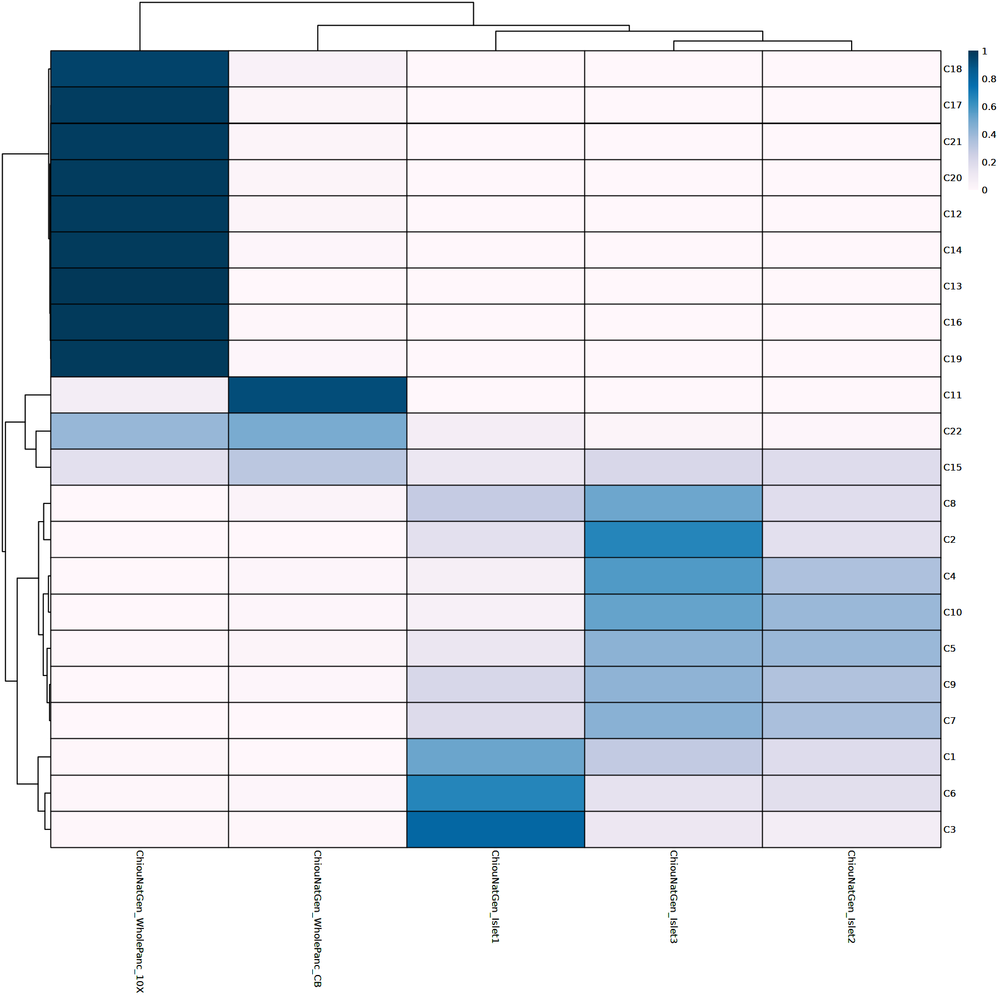

In [ ]:
library(pheatmap)
fig(15,15)

cM <- cM / Matrix::rowSums(cM)
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)
p

In [ ]:
# Harmony: Batch effect correction
proj <- addHarmony(
    ArchRProj = proj,
    reducedDims = "IterativeLSI",
    name = "Harmony",
    groupBy = "Sample",
    force = TRUE
)

Warning message:
“did not converge in 25 iterations”
Warning message:
“did not converge in 25 iterations”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 2002450)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



In [ ]:
# Clustering using Seurat FindClusters() function
proj <- addClusters(
    input = proj,
    reducedDims = "Harmony",
    method = "Seurat",
    name = "ClustersHarmony",
    resolution = 2.0,
    force = TRUE
)

ArchR logging to : ArchRLogs/ArchR-addClusters-6e004d0312e7-Date-2022-05-10_Time-18-51-48.log
If there is an issue, please report to github with logFile!

Overriding previous entry for ClustersHarmony

2022-05-10 18:51:49 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.002 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 40049
Number of edges: 1084904

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7606
Number of communities: 67
Elapsed time: 7 seconds


44 singletons identified. 23 final clusters.

2022-05-10 18:52:59 : Testing Biased Clusters, 1.17 mins elapsed.

2022-05-10 18:52:59 : Testing Outlier Clusters, 1.173 mins elapsed.

2022-05-10 18:52:59 : Assigning Outlier Clusters (n = 1, nOutlier < 5 cells) to Neighbors, 1.173 mins elapsed.

2022-05-10 18:52:59 : Assigning Cluster Names to 22 Clusters, 1.174 mins elapsed.

2022-05-10 18:53:00 : Finished addClusters, 1.178 mins elapsed.



In [ ]:
table(proj$ClustersHarmony)
cM <- confusionMatrix(paste0(proj$ClustersHarmony), paste0(proj$Sample))
cM


  C1  C10  C11  C12  C13  C14  C15  C16  C17  C18  C19   C2  C20  C21  C22   C3 
 353 2038  992  931 1419 1603 2704 2717 3086 1556 2770   60  490  845  534 1085 
  C4   C5   C6   C7   C8   C9 
3872  175  857 2354 4741 4867 

22 x 5 sparse Matrix of class "dgCMatrix"
    ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3 ChiouNatGen_Islet1
C19                      2657                  3                  1
C10                      1975                  3                  5
C7                       2130                  .                  1
C21                       687                  .                  .
C11                       320                236                320
C9                       4365                  6                  3
C16                      2383                  .                  .
C22                       384                  .                  .
C8                       3514                 13                 17
C6                        825                  .                  1
C4                       3751                  1                  5
C14                        48                615                450
C17                       120               1089                980
C18   

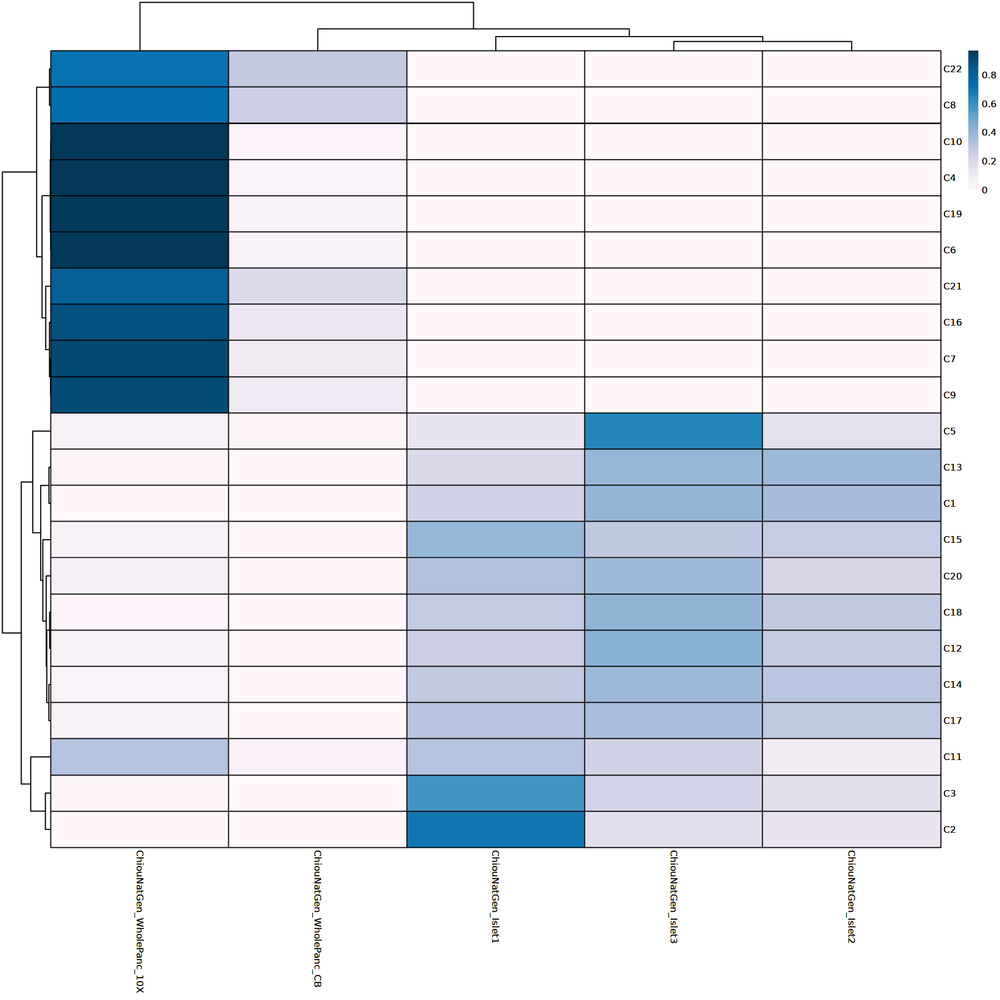

In [ ]:

fig(15,15)
library(pheatmap)
cM <- cM / Matrix::rowSums(cM)
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)
p

## Save Archr Project

In [ ]:
saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ...
  predictedGroup_Unconstrained predictedScore_Unconstrained
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

# Single-Cell Embeddings

## Uniform Manifold Approximation and Projection (UMAP)

In [ ]:
# Harmony
proj <- addUMAP(
    ArchRProj = proj, 
    reducedDims = "Harmony", 
    name = "UMAPHarmony", 
    nNeighbors = 10, 
    minDist = 0.4, 
    metric = "cosine",
    force = TRUE
)

01:34:53 UMAP embedding parameters a = 0.7669 b = 1.223

01:34:53 Read 40049 rows and found 30 numeric columns

01:34:53 Using Annoy for neighbor search, n_neighbors = 10

01:34:53 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

01:35:00 Writing NN index file to temp file /tmp/RtmpLyZpiT/file3387b2e25af

01:35:00 Searching Annoy index using 18 threads, search_k = 1000

01:35:00 Annoy recall = 99.44%

01:35:01 Commencing smooth kNN distance calibration using 18 threads

01:35:02 Initializing from normalized Laplacian + noise

01:35:02 Commencing optimization for 200 epochs, with 636654 positive edges

01:35:40 Optimization finished

01:35:40 Creating temp model dir /tmp/RtmpLyZpiT/dir338768e31c12

01:35:40 Creating dir /tmp/RtmpLyZpiT/dir338768e31c12

01:35:41 Changing 

In [ ]:
proj <- addUMAP(
    ArchRProj = proj, 
    reducedDims = "IterativeLSI", 
    name = "UMAP", 
    nNeighbors = 30, 
    minDist = 0.4, 
    metric = "cosine",
    force = TRUE
)

# Harmony
proj <- addUMAP(
    ArchRProj = proj, 
    reducedDims = "Harmony", 
    name = "UMAPHarmony", 
    nNeighbors = 10, 
    minDist = 0.4, 
    metric = "cosine",
    force = TRUE
)

01:07:15 UMAP embedding parameters a = 0.7669 b = 1.223

01:07:16 Read 40049 rows and found 30 numeric columns

01:07:16 Using Annoy for neighbor search, n_neighbors = 30

01:07:16 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

01:07:21 Writing NN index file to temp file /tmp/RtmpLyZpiT/file338753d1c87e

01:07:21 Searching Annoy index using 18 threads, search_k = 3000

01:07:22 Annoy recall = 100%

01:07:23 Commencing smooth kNN distance calibration using 18 threads

01:07:24 Initializing from normalized Laplacian + noise

01:07:26 Commencing optimization for 200 epochs, with 2043966 positive edges

01:08:23 Optimization finished

01:08:23 Creating temp model dir /tmp/RtmpLyZpiT/dir338748c76895

01:08:23 Creating dir /tmp/RtmpLyZpiT/dir338748c76895

01:08:26 Changing 

In [ ]:
umap1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "UMAP") # Sample
umap2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Clusters", embedding = "UMAP") # Clusters
# Harmony
umap3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "UMAPHarmony") # Sample
umap4 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "ClustersHarmony", embedding = "UMAPHarmony") # Clusters
umap5 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Chiou_CellType", embedding = "UMAPHarmony") # Chiou CellType

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33877f8558b4-Date-2022-05-11_Time-01-35-43.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33877f8558b4-Date-2022-05-11_Time-01-35-43.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33875c001065-Date-2022-05-11_Time-01-35-48.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33875c001065-Date-2022-05-11_Time-01-35-48.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3387108830f0-Date-2022-05-11_Time-01-35-50.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : Arch

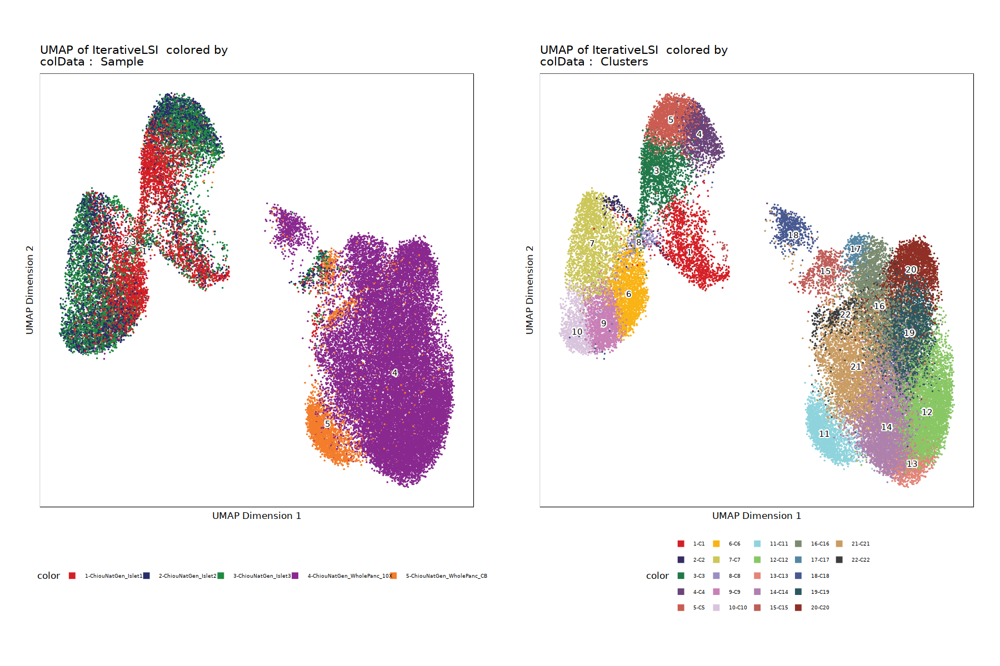

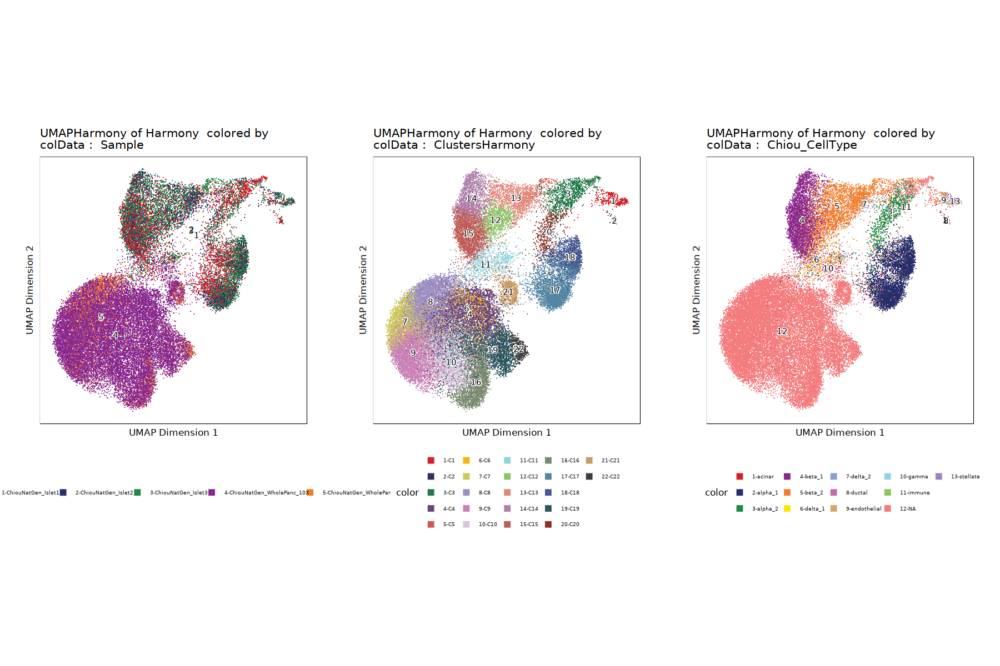

In [ ]:
fig(15,10)
ggAlignPlots(umap1, umap2, type = "h")
ggAlignPlots(umap3, umap4, umap5, type = "h")

In [ ]:
plotPDF(umap1,umap2,umap3,umap4,umap5, name = "Plot-UMAP-Harmony-Sample-Clusters-CellType.pdf", ArchRProj = proj, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



## t-Stocastic Neighbor Embedding (t-SNE)

In [ ]:
proj <- addTSNE(
    ArchRProj = proj, 
    reducedDims = "IterativeLSI", 
    name = "TSNE", 
    perplexity = 30,
    force=TRUE,
)
# Harmony
proj <- addTSNE(
    ArchRProj = proj, 
    reducedDims = "Harmony", 
    name = "TSNEHarmony", 
    perplexity = 30,
    force=TRUE,
)

Read the 40049 x 30 data matrix successfully!
OpenMP is working. 9 threads.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
 - point 10000 of 40049
 - point 20000 of 40049
 - point 30000 of 40049
 - point 40000 of 40049
Done in 59.57 seconds (sparsity = 0.003930)!
Learning embedding...
Iteration 50: error is 110.560960 (50 iterations in 15.70 seconds)
Iteration 100: error is 110.560949 (50 iterations in 15.96 seconds)
Iteration 150: error is 105.843546 (50 iterations in 16.45 seconds)
Iteration 200: error is 103.160131 (50 iterations in 15.38 seconds)
Iteration 250: error is 102.425340 (50 iterations in 15.47 seconds)
Iteration 300: error is 4.799162 (50 iterations in 14.47 seconds)
Iteration 350: error is 4.569317 (50 iterations in 13.50 seconds)
Iteration 400: error is 4.439152 (50 iterations in 13.99 seconds)
Iteration 450: error is 4.350395 (50 iterations in 14.03 seconds)
Iteration 500: error is 4.284198 (50 iteratio

In [ ]:
TSNE1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "TSNE")   # Samples
TSNE2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Clusters", embedding = "TSNE") # Clusters
# Harmony
TSNE3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "TSNEHarmony") # Sample
TSNE4 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "ClustersHarmony", embedding = "TSNEHarmony") # Clusters
TSNE5 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Chiou_CellType", embedding = "TSNEHarmony") # Chiou_CellType

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33871e65f2e2-Date-2022-05-11_Time-00-29-54.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33871e65f2e2-Date-2022-05-11_Time-00-29-54.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3387a8b0422-Date-2022-05-11_Time-00-30-00.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3387a8b0422-Date-2022-05-11_Time-00-30-00.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3387141b5515-Date-2022-05-11_Time-00-30-03.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRL

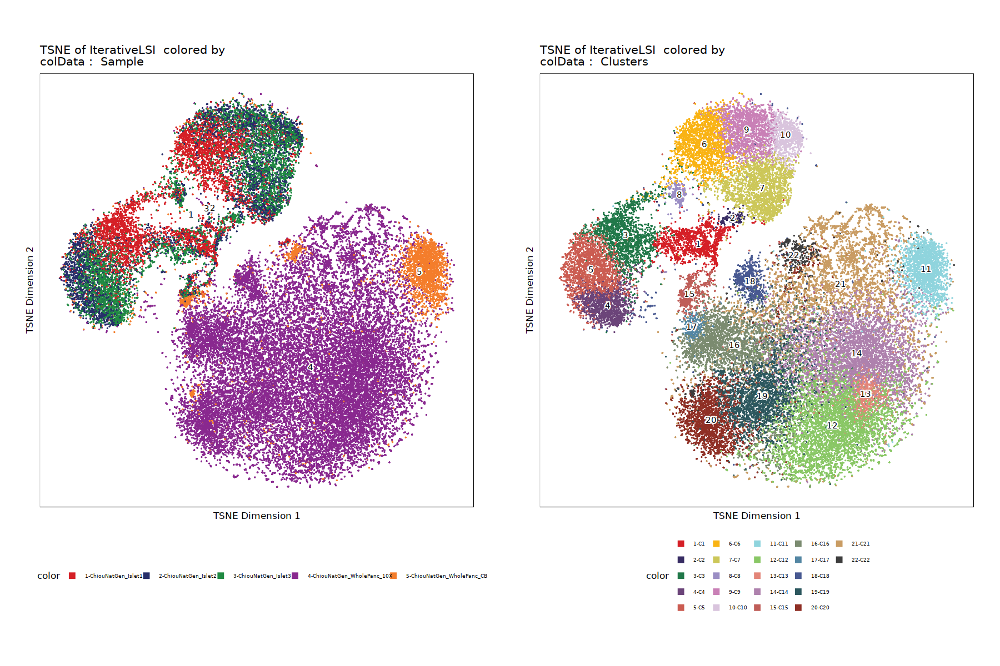

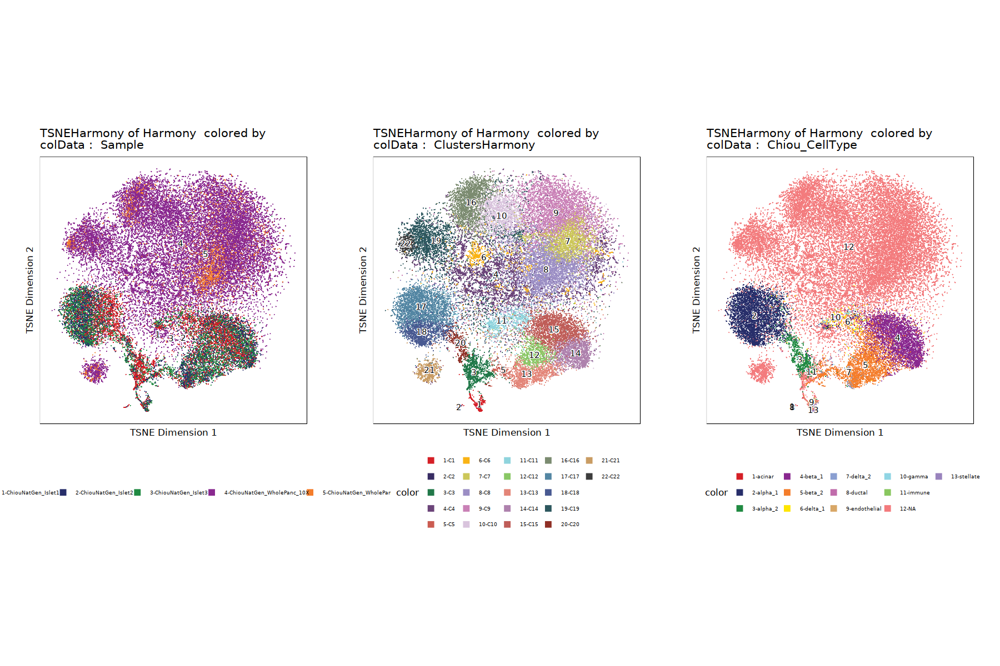

In [ ]:
fig(15,10)
ggAlignPlots(TSNE1, TSNE2, type = "h")
ggAlignPlots(TSNE3, TSNE4, TSNE5, type = "h")

In [ ]:
plotPDF(TSNE1,TSNE2,TSNE3,TSNE4,TSNE5, name = "Plot-TSNEHarmony-Sample-Clusters-CellType.pdf", ArchRProj = proj, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3387184d7ee3-Date-2022-05-11_Time-02-10-14.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3387184d7ee3-Date-2022-05-11_Time-02-10-14.log



[1] "ChiouNatGen_Islet1"


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33873f7bee08-Date-2022-05-11_Time-02-10-24.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33873f7bee08-Date-2022-05-11_Time-02-10-24.log



[1] "ChiouNatGen_Islet2"


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33876accd781-Date-2022-05-11_Time-02-10-30.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33876accd781-Date-2022-05-11_Time-02-10-30.log



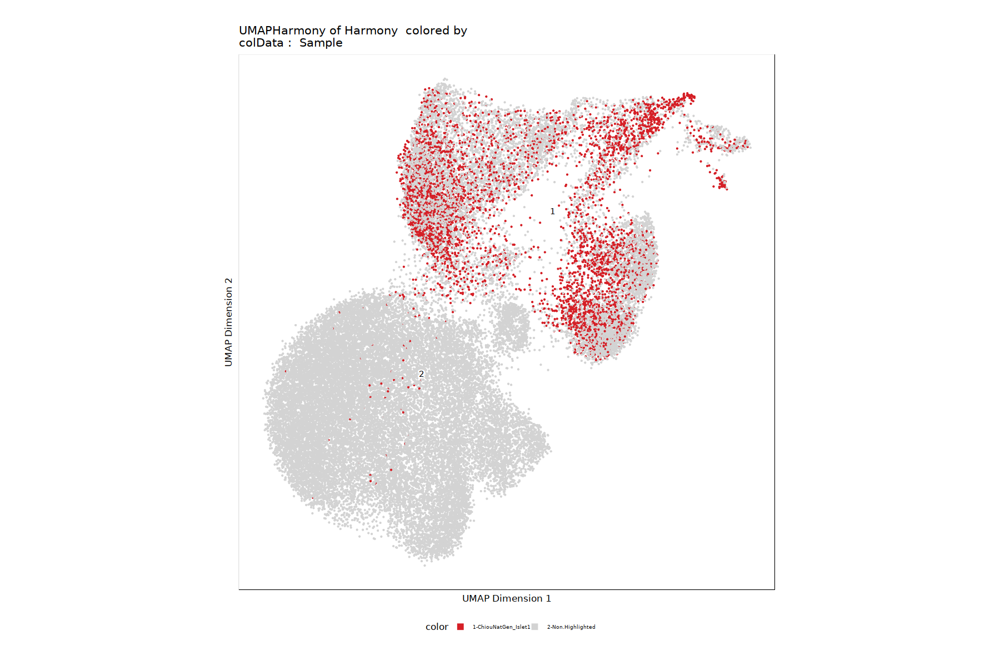

[1] "ChiouNatGen_Islet3"


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3387c401017-Date-2022-05-11_Time-02-10-39.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3387c401017-Date-2022-05-11_Time-02-10-39.log



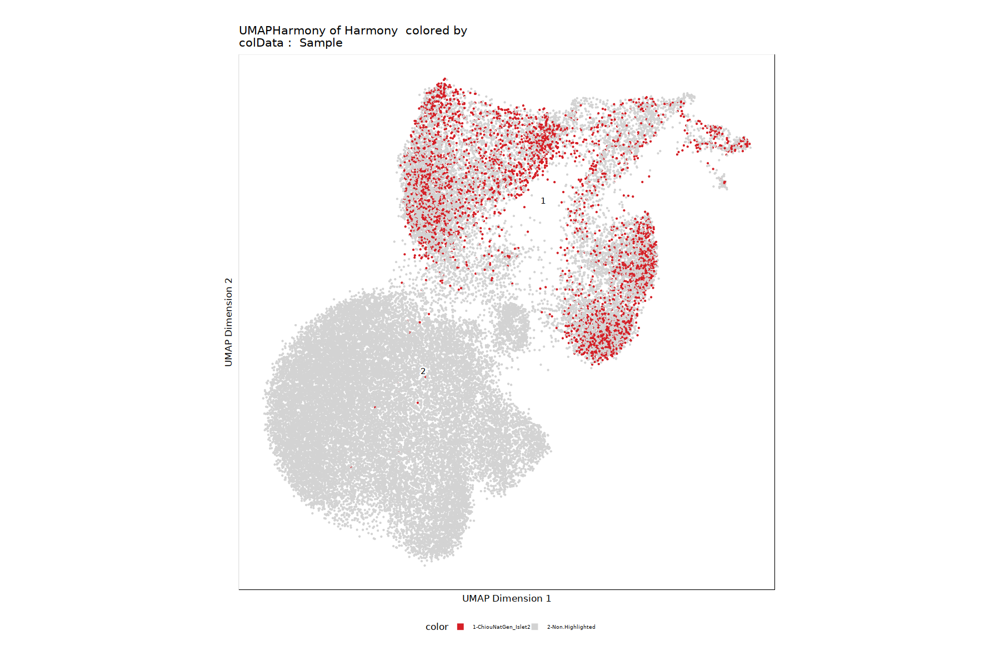

[1] "ChiouNatGen_WholePanc_CB"


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3387582ee56e-Date-2022-05-11_Time-02-10-47.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3387582ee56e-Date-2022-05-11_Time-02-10-47.log



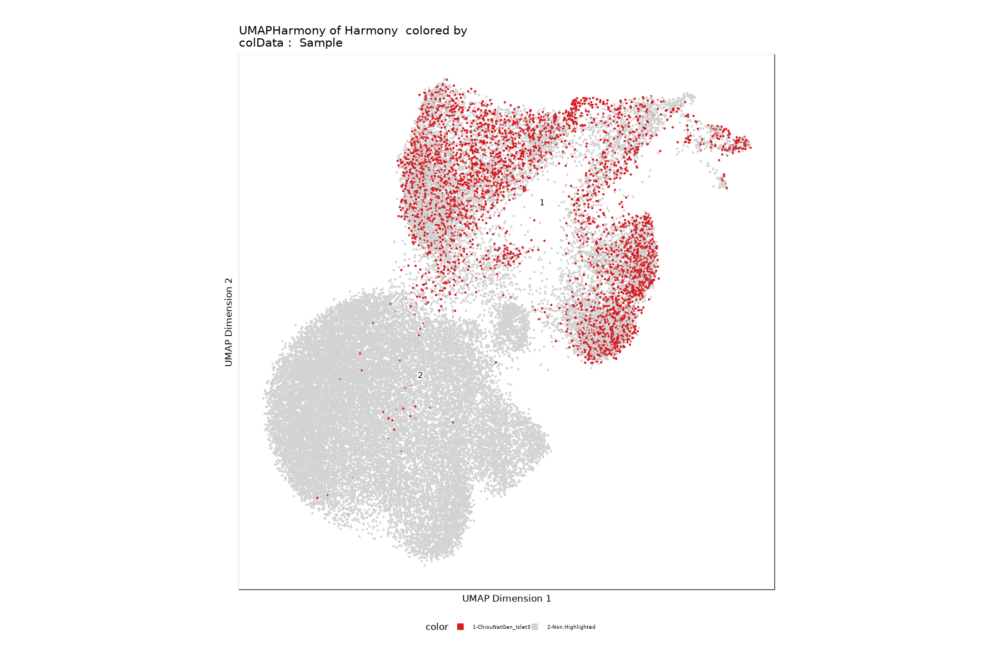

[1] "ChiouNatGen_WholePanc_10X"


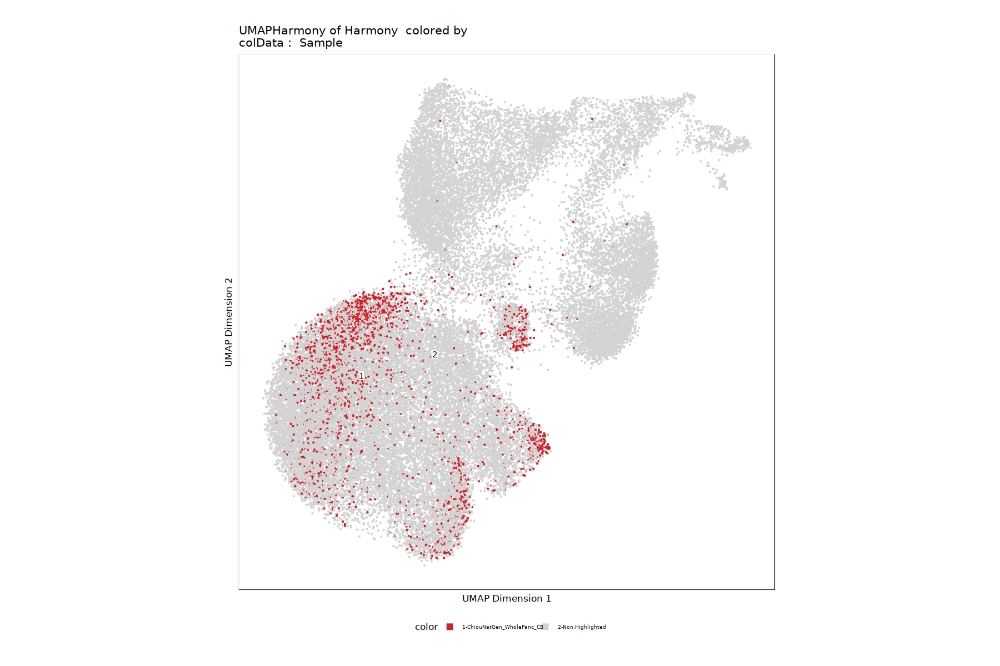

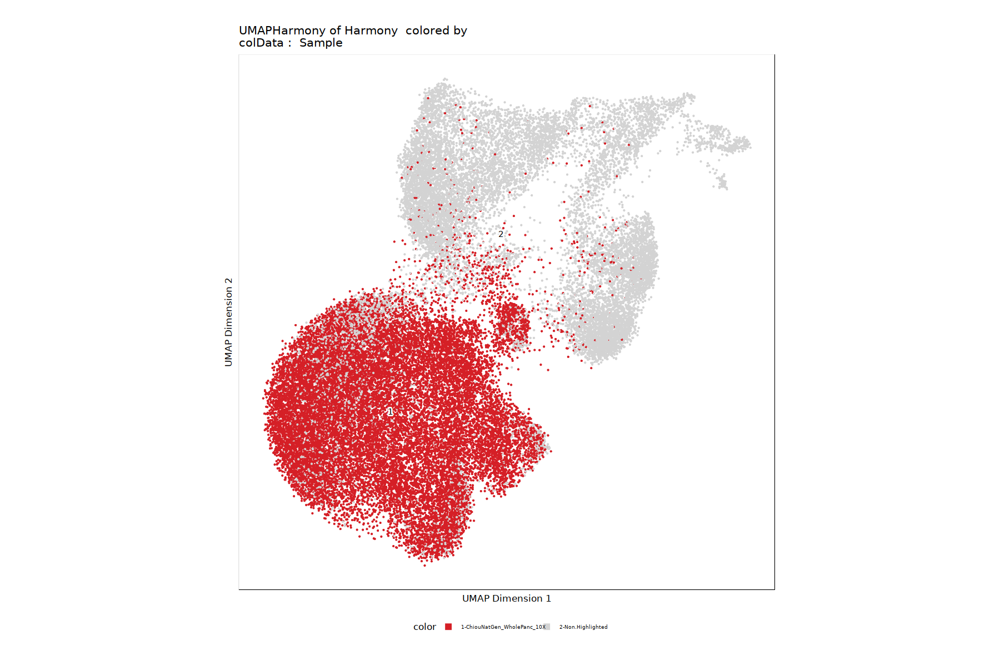

In [ ]:
List <- c("ChiouNatGen_Islet1", 'ChiouNatGen_Islet2', 'ChiouNatGen_Islet3', 'ChiouNatGen_WholePanc_CB' , 'ChiouNatGen_WholePanc_10X')

for (x in List) {
    idxSample <- BiocGenerics::which(proj$Sample %in% x)
cellsSample <- proj$cellNames[idxSample] %>% as.character  
    
    
p <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "UMAPHarmony", highlightCells = cellsSample ) # Sample 
    
    print(x)
    print(p)
}


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33875106a00d-Date-2022-05-11_Time-02-10-59.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33875106a00d-Date-2022-05-11_Time-02-10-59.log



[1] "ChiouNatGen_Islet1"


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33876029eca7-Date-2022-05-11_Time-02-11-04.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33876029eca7-Date-2022-05-11_Time-02-11-04.log



[1] "ChiouNatGen_Islet2"


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3387622299f-Date-2022-05-11_Time-02-11-11.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3387622299f-Date-2022-05-11_Time-02-11-11.log



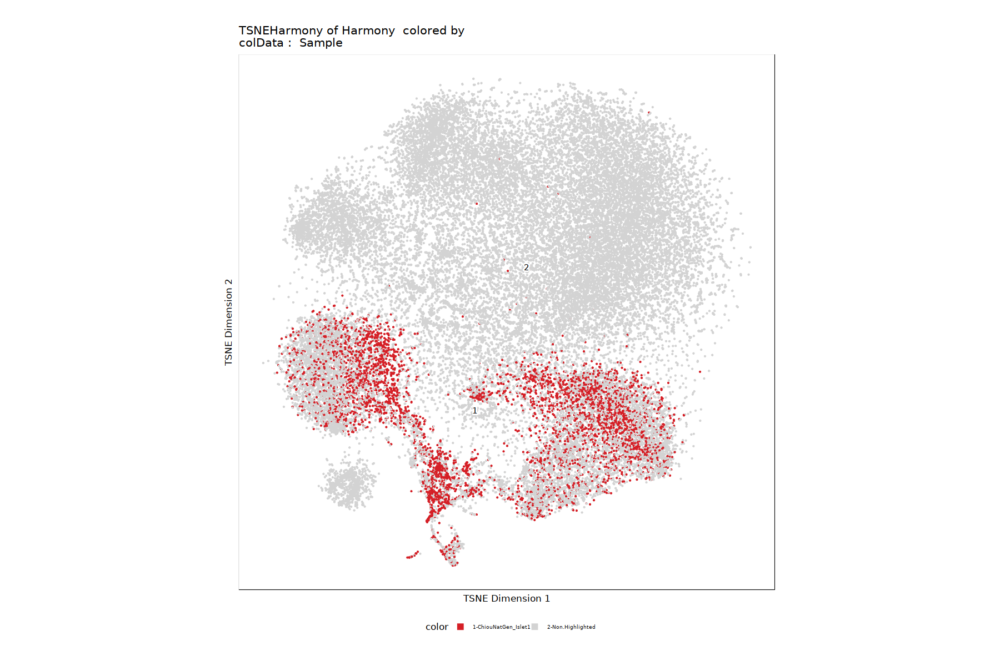

[1] "ChiouNatGen_Islet3"


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33877d149eec-Date-2022-05-11_Time-02-11-19.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33877d149eec-Date-2022-05-11_Time-02-11-19.log



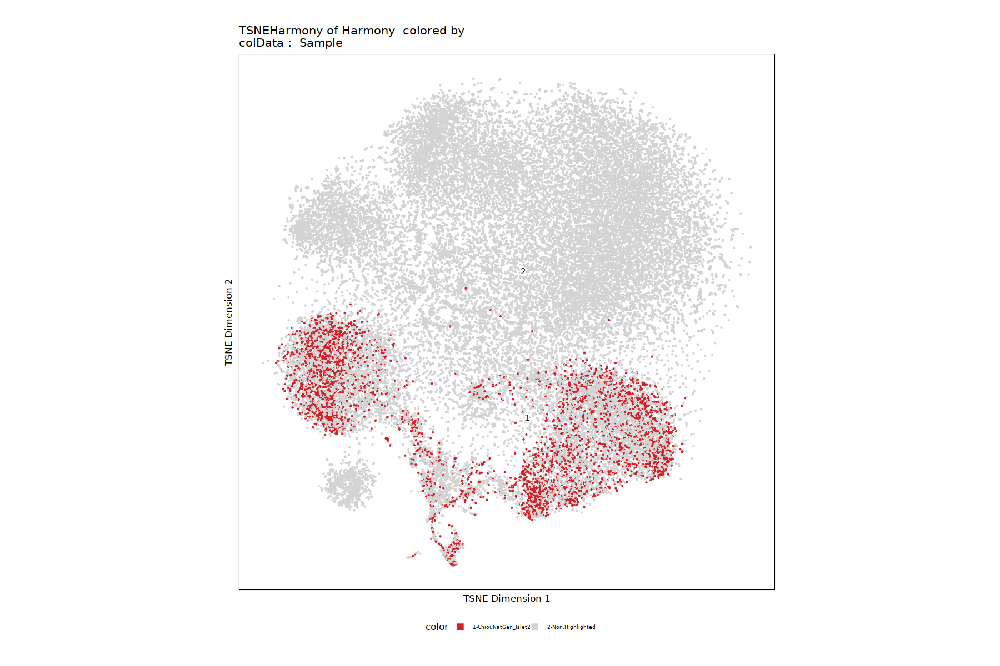

[1] "ChiouNatGen_WholePanc_CB"


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-338766e61fb3-Date-2022-05-11_Time-02-11-27.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-338766e61fb3-Date-2022-05-11_Time-02-11-27.log



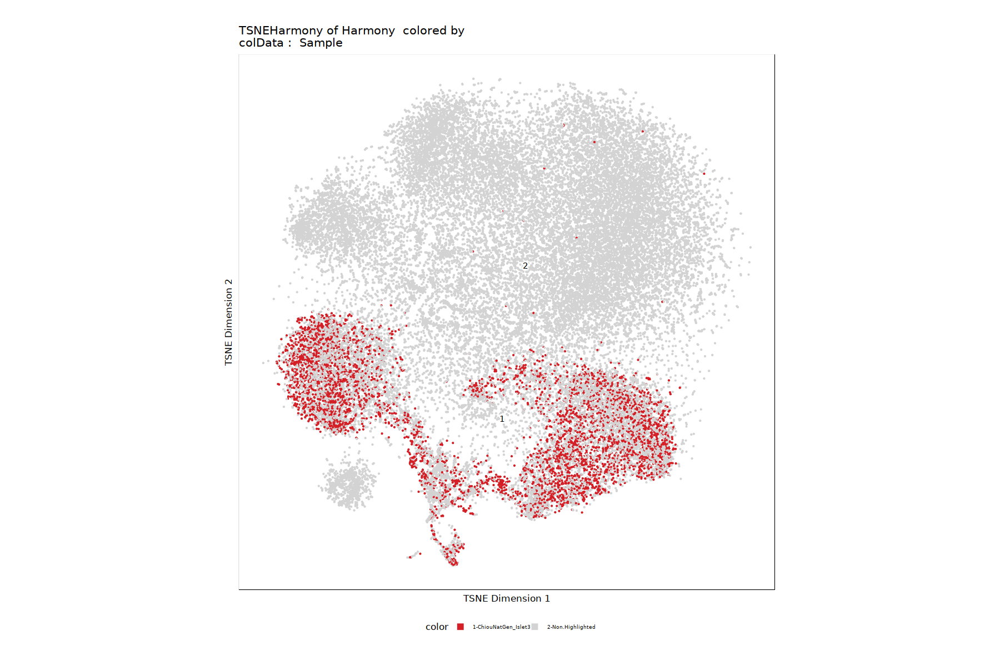

[1] "ChiouNatGen_WholePanc_10X"


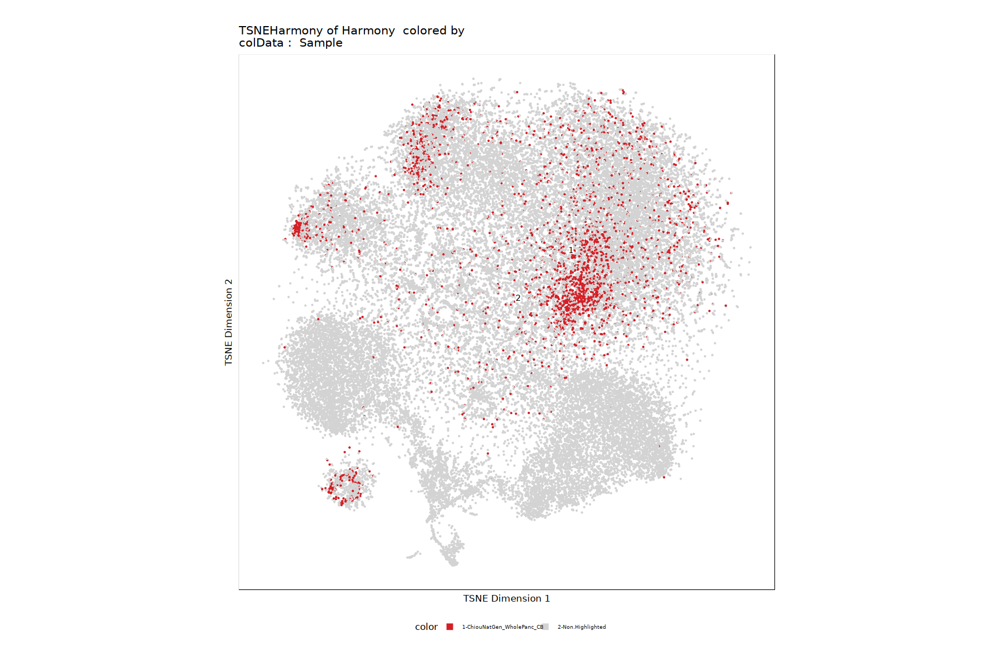

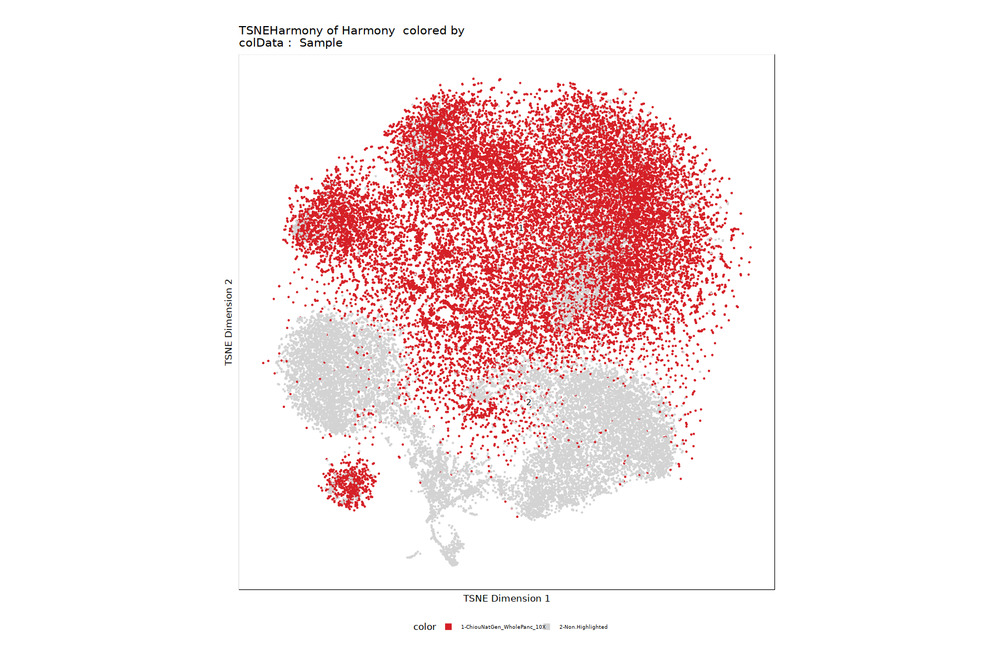

In [ ]:
List <- c("ChiouNatGen_Islet1", 'ChiouNatGen_Islet2', 'ChiouNatGen_Islet3', 'ChiouNatGen_WholePanc_CB' , 'ChiouNatGen_WholePanc_10X')

for (x in List) {
    idxSample <- BiocGenerics::which(proj$Sample %in% x)
cellsSample <- proj$cellNames[idxSample] %>% as.character  
    
    
p <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "TSNEHarmony", highlightCells = cellsSample ) # Sample 
    
    print(x)
    print(p)
}


## Save ArchRProject

In [ ]:
saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ...
  predictedGroup_Unconstrained predictedScore_Unconstrained
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

# Gene Scores and Marker Genes with ArchR

In [ ]:
setwd(ArchRdir)
proj <- loadArchRProject(path = ArchRdir)

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

## Identifying Marker Genes


In [ ]:
markersGS <- getMarkerFeatures(
    ArchRProj = proj, 
    useMatrix = "GeneScoreMatrix", 
    groupBy = "Clusters",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-33874adf728f-Date-2022-05-11_Time-02-11-52.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2022-05-11 02:11:53 : Matching Known Biases, 0.006 mins elapsed.

###########
2022-05-11 02:13:24 : Completed Pairwise Tests, 1.514 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-33874adf728f-Date-2022-05-11_Time-02-11-52.log



In [ ]:
markerListGS <- getMarkers(markersGS, cutOff = "FDR <= 0.01 & Log2FC >= 1.25")

In [ ]:
markerListGS
markerListGS$`Acinar Cells`

List of length 9
names(9): Acinar Cells Alpha Cells Beta Cells ... Stellate Cells Unknown Cells

DataFrame with 1159 rows and 9 columns
      seqnames     start       end  strand     name     idx    Log2FC
         <Rle>   <array>   <array> <array>  <array> <array> <numeric>
15663     chr4 141826003 141814963       2   Cela2a    1224   6.51523
13368     chr3  20275733  20249479       2     Cpb1      70   5.99227
14166     chr3 113156727 113147656       2    Amy2b     868   6.43139
7796     chr15 100687920 100674422       2    Cela1     806   6.39447
11226    chr19  58728887  58744169       1 Pnliprp1     770   6.06487
...        ...       ...       ...     ...      ...     ...       ...
20403     chr7 126368045 126367971       2  Mir7058    1807   2.15673
22034     chr9  19338459  19339400       1  Olfr845      96   1.73045
22206     chr9  35741049  35742252       1  Gm17677     268   1.28402
13056     chr2 164278307 164275956       2     Svs4    1803   1.61093
12034     chr2  85886802  85887737       1 Olfr1023     781   1.65000
               FDR  MeanDiff
         <numeric> <nu

Cell-specific clusters were then manually assigned, as
previously performed for scATAC-seq protocols (38, 41), to endocrine or non-endocrine cell
type by enrichment of canonical endocrine markers (NK2 homeobox 2 (Nkx2.2), paired box
protein 6 (Pax6), and Neurod1. Endocrine cell types were sub-classified into β-cell (Ins1, Ins2,
Nkx6.1, MAF bZip transcription factor A (Mafa), insulin amyloid polypeptide (Iapp)), α-cell
(Gcg, aristaless Related Homeobox (Arx), iroquois homeobox factor 1 (Irx1), MAF bZip
transcription factor B (Mafb)), δ-cell (Sst, peptide YY (Pyy) and hematopoietically-expressed
homeobox protein (Hhex)), and γ-cell clusters (Ppy, tetraspanin 8 (Tspan8), Pyy), while nonendocrine
cells were classified into immune (cluster of differentiation 74 (Cd74),C-C motif
chemokine ligand 3 (Ccl3),histocompatibility 2, class 2 antigen E beta 2 (H2-Eb2)), endothelial
(kinase insert domain receptor (Kdr),SRY-box transcription factor 7 (Sox7),cluster of
differentiation 34 (Cd34)), and stellate cell clusters (heart and neural crest derivatives expressed
2 (Hand2), collagen type VI alpha 1 chain (Col6a1),anoctamin 1 (Ano1)). Clusters that had
enrichment of endocrine and non-endocrine markers (e.g. Kdr and Ins1) or multiple endocrine
cell-specific makers (e.g. Ins1 and Gcg) were considered unclassified as noted in other scATACseq
protocols and are likely unfiltered doublets (41).


In [ ]:
markerGenes  <- c( 'PAX6', 'NEUROD1', # CANONICAL ENDOCRINE MARKERS, COULD NOT FIND NKX2.2
                   'INS', 'INS-IGF2', 'MAFA', 'IAPP', 'PDX1', 'SLC2A2', # BETA CELLS, COULD NOT FIND NKX6.1
                   'GCG', 'ARX', 'IRX1', 'MAFB', # ALPHA CELLS
                   'SST', 'PYY', 'HHEX', 'NEUROG3', # DELTA CELLS
                   'PPY', 'TSPAN8', 'PYY', 'SPP1', # GAMMA CELLS
                   'GHRL', # EPSILON CELLS
                   'CD74', 'CCL3', 'NCF2', # IMMUNE CELLS, COULD NOT FIND 'H2-EBB2'
                   'KDR', 'SOX7', 'CD34', 'PECAM1', 'CDH5', "CD93", # ENDOTHELIAL CELLS
                   'HAND2', 'COL6A1', 'ANO1', # STELLATE CELLS
                   'CPA1', 'AMY2B', 'PTF1A', 'REG1A', # ACINAR CELLS
                   'PDGFRB', 'PDGFRA', # ACTIVATED STELLATE CELLS?
                   'CHGA',
                   'KRT19', 'HNF1B', 'TFF1', 'COL1A1', 'EPCAM', 'SOX9', 'PTPRC', 'PNLIPRP1', 'CFTR', 'MMD2', 'PPP1R1B', 'RAB27B' # DUCTAL CELLS
                   )

### Heatmap of clusters

In [ ]:
heatmapGS <- plotMarkerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.01 & Log2FC >= 1.25", 
  labelMarkers = markerGenes,
  transpose = FALSE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-33873e216c8c-Date-2022-05-11_Time-02-13-26.log
If there is an issue, please report to github with logFile!

Printing Top Marker Genes:

C1:

	TTLL10, TNFRSF18, ACAP3, PUSL1, INTS11, CPTP, DVL1, MIR6808, MIR4252, RCC2, CAMK2N1, SH2D5, TMEM50A, STMN1, MIR3917

C2:

	WLS, MIR1262, ZZZ3, DNAJB4, PRKACB, WDR63, SH3GLB1, SELENOF, FNBP1L, MFSD14A, C1orf194, MIR548AC, UAP1, LRRC52, RC3H1

C3:

	ERICH3, CLCA2, LINC00706, LOC101928298, TRDMT1, CASC10, BAMBI, LINC00993, GPRIN2, BMS1P2, MIR3924, LOC101929574, OR51A7, MIR302E, WT1-AS

C4:

	C1orf158, ADPRHL2, ATPAF1, DAB1-AS1, CCDC190, CR1L, MIR205, MIR5699, LINC01517, MARCH8, KCNMA1-AS2, APBB1, PLET1, LOC100132686, PDZD3

C5:

	PFKP, LINC00708, BEND7, C1QL3, MIR511, ITGB1, GJD4, A1CF, LDB3, IFIT5, SLC18A2, MMP26, PRRG4, CCDC86, LOC105369431

C6:

	NEGR1-IT1, LRRC8C-DT, SLC25A24, AMPD2, IPO9-AS1, TATDN3, RRP15, OPTN, ARL14EP, NAALAD2, FUT4, LOC102723838, LOC101929427, PHC1, RERGL

C7:

	LINC01771

 [1] "PAX6"     "NEUROD1"  "INS"      "INS-IGF2" "MAFA"     "IAPP"    
 [7] "PDX1"     "SLC2A2"   "GCG"      "ARX"      "IRX1"     "MAFB"    
[13] "SST"      "PYY"      "HHEX"     "NEUROG3"  "PPY"      "TSPAN8"  
[19] "PYY"      "SPP1"     "GHRL"     "CD74"     "CCL3"     "KDR"     
[25] "SOX7"     "CD34"     "PECAM1"   "CDH5"     "HAND2"    "COL6A1"  
[31] "ANO1"     "CPA1"     "AMY2B"    "PTF1A"    "REG1A"    "PDGFRB"  
[37] "PDGFRA"   "NCF2"     "CHGA"     "KRT19"    "HNF1B"    "TFF1"    
[43] "COL1A1"   "EPCAM"    "SOX9"     "PTPRC"    "PNLIPRP1" "CFTR"    
[49] "MMD2"     "PPP1R1B"  "RAB27B"  


Preparing Main Heatmap..

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-33873e216c8c-Date-2022-05-11_Time-02-13-26.log



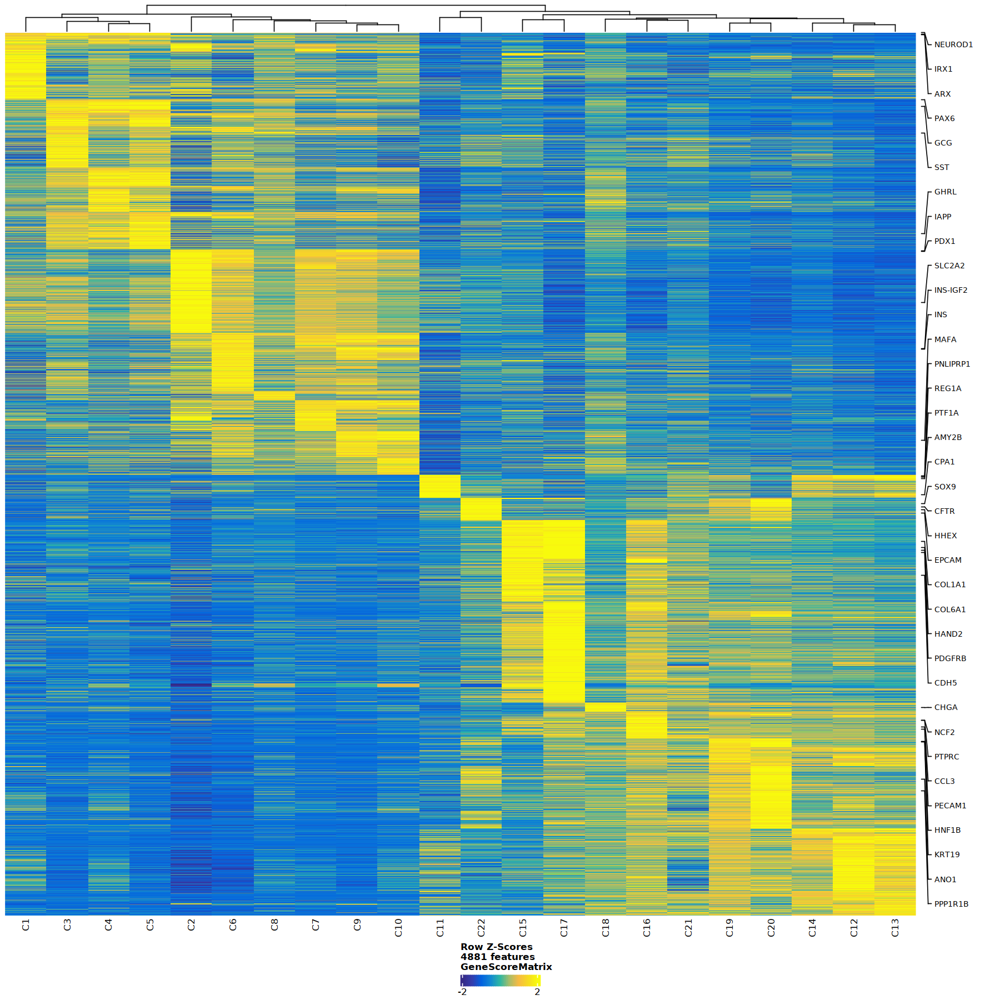

In [ ]:
fig(15,15)
ComplexHeatmap::draw(heatmapGS, heatmap_legend_side = "bot", annotation_legend_side = "bot")

In [ ]:
plotPDF(heatmapGS, name = "GeneScores-Marker-Heatmap", width = 16, height = 20, ArchRProj = proj, addDOC = FALSE)

Plotting ComplexHeatmap!



##  Visualizing Marker Genes on an Embedding

In [ ]:
file.exists(proj@sampleColData$ArrowFiles)

[1] TRUE TRUE TRUE TRUE TRUE

In [ ]:
proj@sampleColData$ArrowFiles

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR/ArrowFiles/ChiouNatGen_WholePanc_10X.arrow"
[2] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR/ArrowFiles/ChiouNatGen_Islet3.arrow"       
[3] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR/ArrowFiles/ChiouNatGen_Islet1.arrow"       
[4] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR/ArrowFiles/ChiouNatGen_Islet2.arrow"       
[5] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR/ArrowFiles/ChiouNatGen_WholePanc_CB.arrow"

In [ ]:
addGeneScoreMatrix(proj)

ERROR: Error in addGeneScoreMatrix(proj): Error Input Arrow Files do not all exist!


In [ ]:
getMatrixFromProject(proj)

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-33876c889df4-Date-2022-05-11_Time-02-13-42.log
If there is an issue, please report to github with logFile!

2022-05-11 02:14:36 : Organizing colData, 0.9 mins elapsed.

2022-05-11 02:14:36 : Organizing rowData, 0.901 mins elapsed.

2022-05-11 02:14:36 : Organizing rowRanges, 0.902 mins elapsed.

2022-05-11 02:14:36 : Organizing Assays (1 of 1), 0.902 mins elapsed.

2022-05-11 02:14:43 : Constructing SummarizedExperiment, 1.021 mins elapsed.

2022-05-11 02:14:44 : Finished Matrix Creation, 1.031 mins elapsed.



class: SummarizedExperiment 
dim: 24919 40049 
metadata(0):
assays(1): GeneScoreMatrix
rownames: NULL
rowData names(6): seqnames start ... name idx
colnames(40049): ChiouNatGen_WholePanc_10X#AACCAACAGACCGCAA-1
  ChiouNatGen_WholePanc_10X#CCCTCTCGTACTAGAA-1 ...
  ChiouNatGen_WholePanc_CB#GATCTTAGCTTTTCTGGCGCAG
  ChiouNatGen_WholePanc_CB#TTGGACCCAGGATGAAATCGGA
colData names(21): BlacklistRatio DoubletEnrichment ...
  predictedGroup_Unconstrained predictedScore_Unconstrained

In [ ]:
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAPHarmony",
    quantCut = c(0.01, 0.95),
    imputeWeights = NULL,
    plotAs = 'points' 
)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33876478d97d-Date-2022-05-11_Time-02-14-44.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-05-11 02:14:46 : 



Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 
34 
35 
36 
37 
38 
39 
40 
41 
42 
43 
44 
45 
46 
47 
48 
49 
50 
51 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33876478d97d-Date-2022-05-11_Time-02-14-44.log



In [ ]:
plotPDF(plotList = p, 
    name = "Plot-HarmonyUMAP-Marker-Genes-WO-Imputation.pdf", 
    ArchRProj = proj, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



## Marker Genes Imputation with MAGIC

In [ ]:
proj <- addImputeWeights(proj)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-3387516c195-Date-2022-05-11_Time-02-18-25.log
If there is an issue, please report to github with logFile!

2022-05-11 02:18:26 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


### UMAP Harmony

In [ ]:
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAPHarmony",
    imputeWeights = getImputeWeights(proj),
    plotAs = 'points'
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-3387430b5771-Date-2022-05-11_Time-02-19-13.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-05-11 02:19:19 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 
34 
35 
36 
37 
38 
39 
40 
41 
42 
43 
44 
45 
46 
47 
48 
49 
50 
51 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-3387430b5771-Date-2022-05-11_Time-02-19-13.log



In [ ]:
plotPDF(plotList = p, 
    name = "Plot-UMAPHarmony-Marker-Genes-W-Imputation.pdf", 
    ArchRProj = proj, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



### tSNE Harmony

In [ ]:
p <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "TSNEHarmony",
    imputeWeights = getImputeWeights(proj),
    plotAs = 'points'
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-338776f11cbd-Date-2022-05-11_Time-02-23-00.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-05-11 02:23:06 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 
34 
35 
36 
37 
38 
39 
40 
41 
42 
43 
44 
45 
46 
47 
48 
49 
50 
51 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-338776f11cbd-Date-2022-05-11_Time-02-23-00.log



In [ ]:
plotPDF(plotList = p, 
    name = "Plot-TSNEHarmony-Marker-Genes-W-Imputation.pdf", 
    ArchRProj = proj, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



## Track Plotting with ArchRBrowser

In [ ]:
markerGenes  <- c( 'PAX6', 'NEUROD1', # CANONICAL ENDOCRINE MARKERS, COULD NOT FIND NKX2.2
                   'INS', 'INS-IGF2', 'MAFA', 'IAPP', 'PDX1', 'SLC2A2', # BETA CELLS, COULD NOT FIND NKX6.1
                   'GCG', 'ARX', 'IRX1', 'MAFB', # ALPHA CELLS
                   'SST', 'PYY', 'HHEX', 'NEUROG3', # DELTA CELLS
                   'PPY', 'TSPAN8', 'PYY', 'SPP1', # GAMMA CELLS
                   'GHRL', # EPSILON CELLS
                   'CD74', 'CCL3', 'NCF2', # IMMUNE CELLS, COULD NOT FIND 'H2-EBB2'
                   'KDR', 'SOX7', 'CD34', 'PECAM1', 'CDH5', 'CD93', # ENDOTHELIAL CELLS
                   'HAND2', 'COL6A1', 'ANO1', # STELLATE CELLS
                   'CPA1', 'AMY2B', 'PTF1A', 'REG1A', # ACINAR CELLS
                   'PDGFRB', 'PDGFRA', # ACTIVATED STELLATE CELLS?
                   'CHGA',
                   'KRT19', 'HNF1B', 'TFF1', 'COL1A1', 'EPCAM', 'SOX9', 'PTPRC', 'PNLIPRP1', 'CFTR', 'MMD2', 'PPP1R1B', 'RAB27B' # DUCTAL CELLS
                   )

### Browsertracks of Clusters

In [ ]:
p <- plotBrowserTrack(
    ArchRProj = proj, 
    groupBy = "Clusters", 
    geneSymbol = markerGenes, 
    upstream = 50000,
    downstream = 50000
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-33873e34a09e-Date-2022-05-11_Time-02-27-16.log
If there is an issue, please report to github with logFile!

2022-05-11 02:27:16 : Validating Region, 0.011 mins elapsed.



GRanges object with 51 ranges and 2 metadata columns:
       seqnames              ranges strand |     gene_id      symbol
          <Rle>           <IRanges>  <Rle> | <character> <character>
   [1]    chr11   31784792-31817961      - |        5080        PAX6
   [2]     chr2 181673088-181680876      - |        4760     NEUROD1
   [3]    chr11     2159779-2161341      - |        3630         INS
   [4]    chr11     2132538-2161209      - |      723961    INS-IGF2
   [5]     chr8 143428060-143430406      - |      389692        MAFA
   ...      ...                 ...    ... .         ...         ...
  [47]    chr10 116590385-116609175      + |        5407    PNLIPRP1
  [48]     chr7 117465784-117715948      + |        1080        CFTR
  [49]     chr7     4905989-4959213      - |      221938        MMD2
  [50]    chr17   39626740-39636626      + |       84152     PPP1R1B
  [51]    chr18   54717860-54895516      + |        5874      RAB27B
  -------
  seqinfo: 24 sequences from hg38 genom

2022-05-11 02:27:17 : Adding Bulk Tracks (1 of 51), 0.016 mins elapsed.

Length of unique values greater than palette, interpolating..

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-05-11 02:27:23 : Adding Gene Tracks (1 of 51), 0.117 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-05-11 02:27:23 : Plotting, 0.124 mins elapsed.

2022-05-11 02:27:27 : Adding Bulk Tracks (2 of 51), 0.187 mins elapsed.

Length of unique values greater than palette, interpolating..

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-05-11 02:27:31 : Adding Gene Tracks (2 of 51), 0.251 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-05-11 02:27:31 : Plotting, 0.256 mins elapsed.

2022-05-11 02:27:35 : Adding Bulk Tracks (3 of 5

In [ ]:
grid::grid.newpage()
grid::grid.draw(p$Ppy)

In [ ]:
plotPDF(plotList = p, 
    name = "Plot-Tracks-Marker-Genes.pdf", 
    ArchRProj = proj, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


In [ ]:
SelectedGenes <-c('INS-IGF2',
                 'GCG',
                 'SST',
                 'CPA1',
                 'CFFTR',
                 'PDGFRB',
                 'PECAM1'
                )

In [ ]:
grid::grid.draw(p$PECAM1)

In [ ]:
p <- plotBrowserTrack(
    ArchRProj = proj, 
    groupBy = "CellType", 
    geneSymbol = 'PDGFRB', 
    upstream = 20000,
    downstream = 10000
)
grid::grid.newpage()
grid::grid.draw(p$PDGFRB)
plotPDF(plotList = p, 
    name = "Plot-Tracks-PDGFRB-Genes.pdf", 
    ArchRProj = proj, 
    addDOC = FALSE, width = 5, height = 5)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-55aa7f603747-Date-2022-05-12_Time-08-24-38.log
If there is an issue, please report to github with logFile!

2022-05-12 08:24:38 : Validating Region, 0.011 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]     chr5 150113837-150155872      - |        5159      PDGFRB
  -------
  seqinfo: 24 sequences from hg38 genome


2022-05-12 08:24:38 : Adding Bulk Tracks (1 of 1), 0.013 mins elapsed.



In [ ]:
p <- plotBrowserTrack(
    ArchRProj = proj, 
    groupBy = "CellType", 
    geneSymbol = SelectedGenes, 
    upstream = 20000,
    downstream = 10000
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-55aa5fcbccee-Date-2022-05-12_Time-08-15-11.log
If there is an issue, please report to github with logFile!

2022-05-12 08:15:11 : Validating Region, 0.01 mins elapsed.



GRanges object with 6 ranges and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]    chr11     2132538-2161209      - |      723961    INS-IGF2
  [2]     chr2 162142873-162152404      - |        2641         GCG
  [3]     chr3 187668906-187670399      - |        6750         SST
  [4]     chr7 130380339-130388114      + |        1357        CPA1
  [5]     chr5 150113837-150155872      - |        5159      PDGFRB
  [6]    chr17   64319415-64413776      - |        5175      PECAM1
  -------
  seqinfo: 24 sequences from hg38 genome


2022-05-12 08:15:11 : Adding Bulk Tracks (1 of 6), 0.012 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-05-12 08:15:13 : Adding Gene Tracks (1 of 6), 0.04 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-05-12 08:15:14 : Plotting, 0.053 mins elapsed.

2022-05-12 08:15:15 : Adding Bulk Tracks (2 of 6), 0.077 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-05-12 08:15:19 : Adding Gene Tracks (2 of 6), 0.147 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-05-12 08:15:20 : Plotting, 0.155 mins elapsed.

2022-05-12 08:15:21 : Adding Bulk Tracks (3 of 6), 0.173 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


In [ ]:
plotPDF(plotList = p, 
    name = "Plot-Tracks-Selected-Genes.pdf", 
    ArchRProj = proj, 
    addDOC = FALSE, width = 5, height = 5)

Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


## Save ArchRPRoject

In [ ]:
saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ...
  predictedGroup_Unconstrained predictedScore_Unconstrained
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

In [ ]:
proj@cellColData$TSSEnrichment

In [ ]:
p1 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
   name = "TSSEnrichment", 
    embedding = "UMAPHarmony",
    imputeWeights = getImputeWeights(proj),
    plotAs = 'points'
)

p2 <- plotEmbedding(
    ArchRProj = proj, 
    colorBy = "cellColData", 
   name = "TSSEnrichment", 
    embedding = "TSNEHarmony",
    imputeWeights = getImputeWeights(proj),
    plotAs = 'points'
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8d299ff9be9-Date-2022-05-10_Time-00-07-28.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8d299ff9be9-Date-2022-05-10_Time-00-07-28.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8d295cf446e0-Date-2022-05-10_Time-00-07-51.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8d295cf446e0-Date-2022-05-10_Time-00-07-51.log



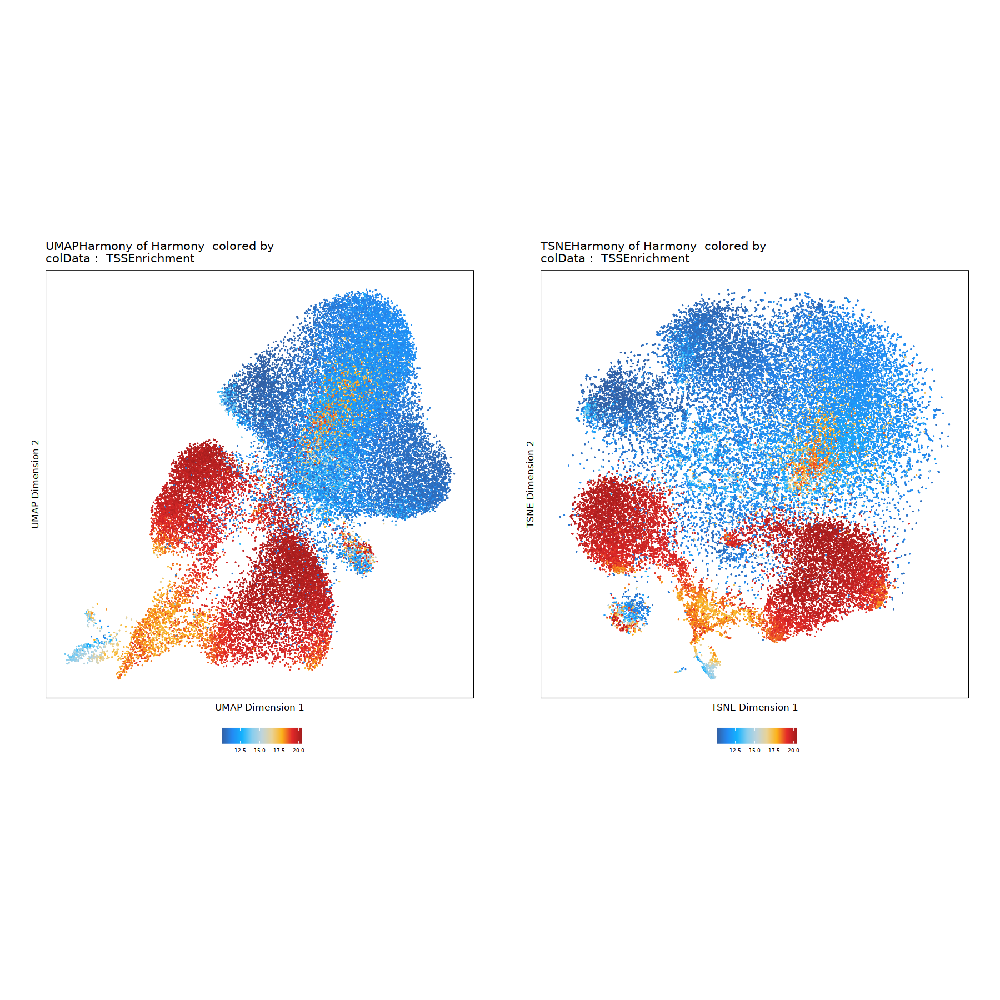

In [ ]:
p1 + p2

In [ ]:
List <- c('ChiouNatGen_Islet1', 'ChiouNatGen_Islet2', 'ChiouNatGen_Islet3', 'ChiouNatGen_WholePanc_CB', 'ChiouNatGen_WholePanc_10X')

    idxSample <- BiocGenerics::which(proj$Sample %in% 'ChiouNatGen_WholePanc_10X')
cellsSample <- proj$cellNames[idxSample]
projsubset <- proj[cellsSample, ]



Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!



In [ ]:
projsubset <- addImputeWeights(projsubset)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-8d291772d4a2-Date-2022-05-10_Time-00-11-53.log
If there is an issue, please report to github with logFile!

2022-05-10 00:11:55 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


In [ ]:
p1 <- plotEmbedding(
    ArchRProj = projsubset, 
    colorBy = "cellColData", 
   name = "TSSEnrichment", 
    embedding = "UMAPHarmony",
   # imputeWeights = getImputeWeights(projsubset),
    plotAs = 'points'
)

p2 <- plotEmbedding(
    ArchRProj = projsubset, 
    colorBy = "cellColData", 
   name = "TSSEnrichment", 
    embedding = "TSNEHarmony",
    #imputeWeights = getImputeWeights(projsubset),
    plotAs = 'points'
)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8d2929fefaff-Date-2022-05-10_Time-15-02-43.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8d2929fefaff-Date-2022-05-10_Time-15-02-43.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8d29509d774d-Date-2022-05-10_Time-15-02-55.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8d29509d774d-Date-2022-05-10_Time-15-02-55.log



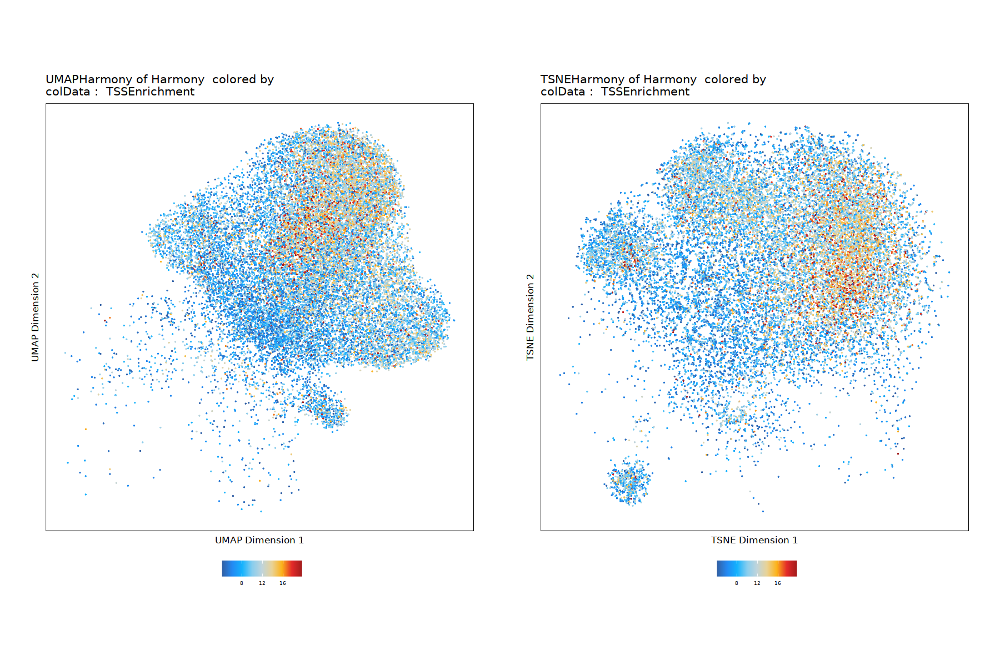

In [ ]:
p1 + p2

In [ ]:
projsubset@cellColData %>% str

Formal class 'DFrame' [package "S4Vectors"] with 6 slots
  ..@ rownames       : chr [1:23433] "ChiouNatGen_WholePanc_10X#AACCAACAGACCGCAA-1" "ChiouNatGen_WholePanc_10X#CCCTCTCGTACTAGAA-1" "ChiouNatGen_WholePanc_10X#AATACGCTCGGATAGG-1" "ChiouNatGen_WholePanc_10X#GCACGCACAATGGTCT-1" ...
  ..@ nrows          : int 23433
  ..@ listData       :List of 18
  .. ..$ Sample           :Formal class 'Rle' [package "S4Vectors"] with 4 slots
  .. .. .. ..@ values         : chr "ChiouNatGen_WholePanc_10X"
  .. .. .. ..@ lengths        : int 23433
  .. .. .. ..@ elementMetadata: NULL
  .. .. .. ..@ metadata       : list()
  .. ..$ TSSEnrichment    : num [1:23433(1d)] 4.24 5.52 8.15 5.29 5.89 ...
  .. ..$ ReadsInTSS       : num [1:23433(1d)] 4778 7129 9375 4396 3959 ...
  .. ..$ ReadsInPromoter  : num [1:23433(1d)] 6921 9291 10704 5906 4744 ...
  .. ..$ ReadsInBlacklist : num [1:23433(1d)] 722 474 500 393 490 649 478 536 591 549 ...
  .. ..$ PromoterRatio    : num [1:23433(1d)] 0.0634 0.0903 0.1247 0.

In [ ]:
p1 <- plotEmbedding(
    ArchRProj = projsubset, 
    colorBy = "cellColData", 
   name = "nFrags", 
    embedding = "UMAPHarmony",
   # imputeWeights = getImputeWeights(projsubset),
    plotAs = 'points'
)

p2 <- plotEmbedding(
    ArchRProj = projsubset, 
    colorBy = "cellColData", 
   name = "nFrags", 
    embedding = "TSNEHarmony",
    #imputeWeights = getImputeWeights(projsubset),
    plotAs = 'points'
)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8d2922cdad57-Date-2022-05-10_Time-15-05-29.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8d2922cdad57-Date-2022-05-10_Time-15-05-29.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8d2940eef86-Date-2022-05-10_Time-15-05-35.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8d2940eef86-Date-2022-05-10_Time-15-05-35.log



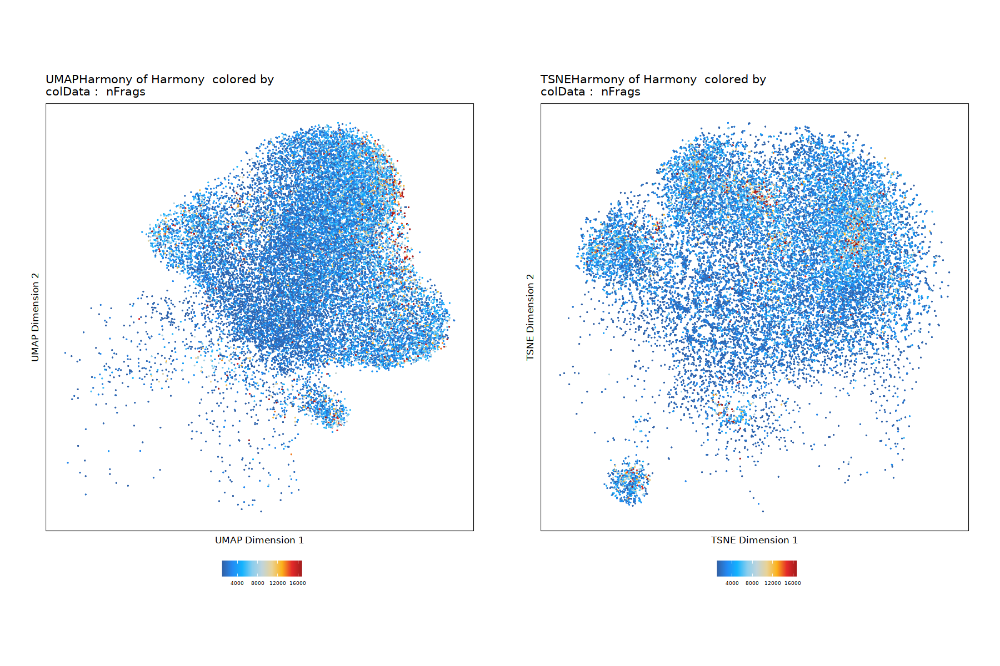

In [ ]:
p1 + p2

In [ ]:
proj@cellColData %>% colnames

[1] "Sample"            "TSSEnrichment"     "ReadsInTSS"       
 [4] "ReadsInPromoter"   "ReadsInBlacklist"  "PromoterRatio"    
 [7] "PassQC"            "NucleosomeRatio"   "nMultiFrags"      
[10] "nMonoFrags"        "nFrags"            "nDiFrags"         
[13] "DoubletScore"      "DoubletEnrichment" "BlacklistRatio"   
[16] "Clusters"          "ClustersHarmony"   "Chiou_CellType"

1 
Warning message:
“`expand_scale()` is deprecated; use `expansion()` instead.”


1 


Picking joint bandwidth of 0.861

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”


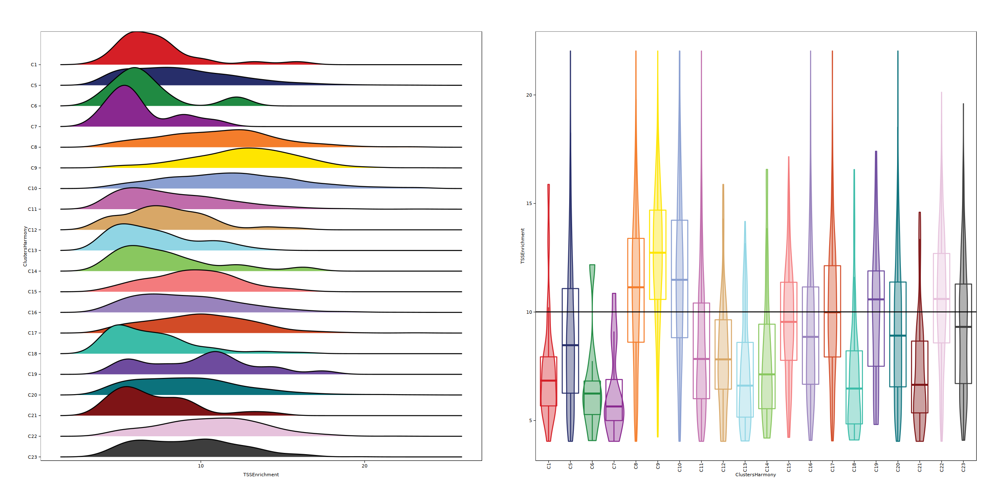

In [ ]:
# TSS enrichment score

fig(20,10)

p1 <- plotGroups(
    ArchRProj = projsubset, 
    groupBy = "ClustersHarmony", 
    colorBy = "cellColData",
    name = "TSSEnrichment",
    plotAs = "ridges"
   )

p2 <- plotGroups(
    ArchRProj = projsubset, 
    groupBy = "ClustersHarmony", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   ) + geom_hline(yintercept=10)

p1 + p2

1 
Warning message:
“`expand_scale()` is deprecated; use `expansion()` instead.”


1 


Picking joint bandwidth of 693

Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”
Warning message:
“It is deprecated to specify `guide = FALSE` to remove a guide. Please use `guide = "none"` instead.”


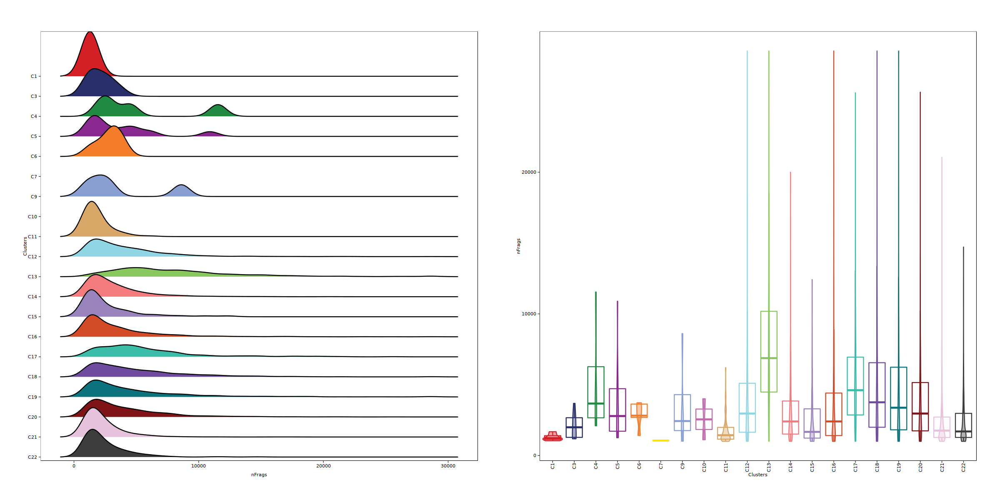

In [ ]:
# TSS enrichment score

fig(20,10)

p1 <- plotGroups(
    ArchRProj = projsubset, 
    groupBy = "Clusters", 
    colorBy = "cellColData",
    name = "nFrags",
    plotAs = "ridges"
   )

p2 <- plotGroups(
    ArchRProj = projsubset, 
    groupBy = "Clusters", 
    colorBy = "cellColData", 
    name = "nFrags",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )

p1 + p2

In [ ]:
table(projsubset$Clusters)
cM <- confusionMatrix(paste0(projsubset$Clusters), paste0(projsubset$Sample))
cM


  C1  C10  C11  C12  C13  C14  C15  C16  C17  C18  C19  C20  C21  C22   C3   C4 
   6    2  161 4809  745 4699  109 2924  323  799 2492 2155 3924  250    7    4 
  C5   C6   C7   C9 
  10    9    1    4 

20 x 1 sparse Matrix of class "dgCMatrix"
    ChiouNatGen_WholePanc_10X
C16                      2924
C19                      2492
C13                       745
C18                       799
C12                      4809
C20                      2155
C14                      4699
C17                       323
C21                      3924
C22                       250
C15                       109
C4                          4
C5                         10
C9                          4
C11                       161
C10                         2
C6                          9
C3                          7
C1                          6
C7                          1

In [ ]:
quantile(projsubset$TSSEnrichment)
quantile(projsubset$nFrags)

0%    25%    50%    75%   100% 
 4.000  7.429 10.079 12.644 33.569

0%   25%   50%   75%  100% 
 1000  1504  2565  4550 54575

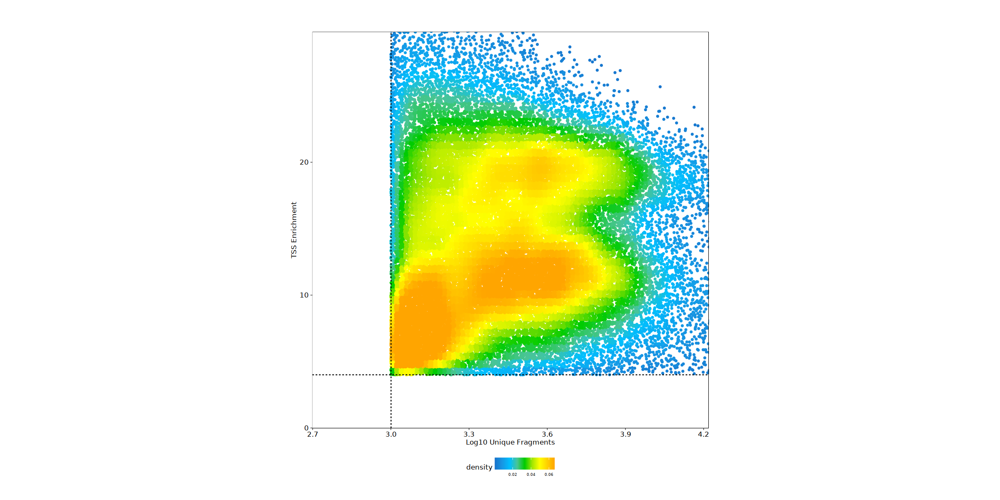

In [ ]:
df <- getCellColData(proj, select = c("log10(nFrags)", "TSSEnrichment"))

TSS_VS_Frags <- ggPoint(
    x = df[,1], 
    y = df[,2], 
    colorDensity = TRUE,
    continuousSet = "sambaNight",
    xlabel = "Log10 Unique Fragments",
    ylabel = "TSS Enrichment",
    xlim = c(log10(500), quantile(df[,1], probs = 0.99)),
    ylim = c(0, quantile(df[,2], probs = 0.99))
) + geom_hline(yintercept = 4, lty = "dashed") + geom_vline(xintercept = 3, lty = "dashed")

TSS_VS_Frags

In [ ]:
projsubset


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(18): Sample TSSEnrichment ... ClustersHarmony
  Chiou_CellType
numberOfCells(1): 23433
medianTSS(1): 10.079
medianFrags(1): 2565

In [ ]:
#  TSS Enrichment score for each cells
quantile(projsubset$TSSEnrichment)

0%    25%    50%    75%   100% 
 4.000  7.429 10.079 12.644 33.569

# Label scATAC-seq clusters

## Cross-modality linkage of scATAC-seq data with scRNAseq data to define cluster identity

In [ ]:
seRNA <- readRDS("/staging/leuven/stg_00041/SanKit/SKT013_Tosti_snRNA_Pancreas/RDS/SKT013.01.4_Tosti_RNA_AdultPancreas_DoubletFinder.rds")
seRNA 

An object of class Seurat 
53799 features across 111452 samples within 2 assays 
Active assay: SCT (26559 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [ ]:
# Gene Activity values are not normalised by running through SCTransform
# They are logNormalised
# Therefore, scRNAseq data should also be logNormalised instead.

DefaultAssay(seRNA) <- 'RNA'
seRNA <- NormalizeData(seRNA)
seRNA <- ScaleData(seRNA)

#seRNA <- FindVariableFeatures(seRNA)
#seRNA <- RunPCA(seRNA)
#seRNA <- RunUMAP(seRNA, dims = 1:30)

Centering and scaling data matrix



In [ ]:
proj <- addGeneIntegrationMatrix(
    ArchRProj = proj, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seRNA,
    addToArrow = FALSE,
    groupRNA = "Cluster",
    nameCell = "predictedCell_Unconstrained",
    nameGroup = "predictedGroup_Unconstrained",
    nameScore = "predictedScore_Unconstrained",
    threads = 1
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-338745336814-Date-2022-05-11_Time-15-23-29.log
If there is an issue, please report to github with logFile!

2022-05-11 15:23:30 : Running Seurat's Integration Stuart* et al 2019, 0.024 mins elapsed.

2022-05-11 15:23:30 : Checking ATAC Input, 0.028 mins elapsed.

2022-05-11 15:23:30 : Checking RNA Input, 0.028 mins elapsed.

2022-05-11 15:23:38 : Found 17424 overlapping gene names from gene scores and rna matrix!, 0.162 mins elapsed.

2022-05-11 15:23:38 : Creating Integration Blocks, 0.163 mins elapsed.

2022-05-11 15:23:42 : Prepping Interation Data, 0.225 mins elapsed.

2022-05-11 15:23:45 : Computing Integration in 4 Integration Blocks!, 0 mins elapsed.

2022-05-11 15:23:45 : Block (1 of 4) : Computing Integration, 0 mins elapsed.

2022-05-11 15:23:51 : Block (1 of 4) : Identifying Variable Genes, 0.102 mins elapsed.

2022-05-11 15:23:53 : Block (1 of 4) : Getting GeneScoreMatrix, 0.136 mins elapsed.

2022-05-11 15:24:11 :

In [ ]:
cM <- as.matrix(confusionMatrix(proj$ClustersHarmony, proj$predictedGroup_Unconstrained))
preClust <- colnames(cM)[apply(cM, 1 , which.max)]
Matrix <- cbind(preClust, rownames(cM)) #Assignments
Matrix[order(Matrix[,1], decreasing=FALSE),]


preClust,
Acinar-i,C6
Acinar-i,C4
Acinar-i,C3
Acinar-i,C20
Acinar-i,C5
Acinar-i,C13
Acinar-i,C2
Acinar-s,C7
Acinar-s,C9
Acinar-s,C8


In [ ]:
unique(unique(proj$predictedGroup_Unconstrained))

[1] "Acinar-s"           "Ductal"             "Activated Stellate"
 [4] "Alpha"              "Endothelial"        "Acinar-i"          
 [7] "Beta"               "Delta"              "Acinar-REG+"       
[10] "Macrophage"         "MUC5B+ Ductal"

In [ ]:
proj@cellColData$predictedGroup_Unconstrained %>% head

[1] "Acinar-s"           "Ductal"             "Acinar-s"          
[4] "Acinar-s"           "Activated Stellate" "Ductal"

In [ ]:
umap3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "UMAPHarmony") # Sample
umap4 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "ClustersHarmony", embedding = "UMAPHarmony") # Clusters
umap5 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "predictedGroup_Unconstrained", embedding = "UMAPHarmony") # Unconstrained cross-platform linkage

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33873deacb15-Date-2022-05-11_Time-16-51-56.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33873deacb15-Date-2022-05-11_Time-16-51-56.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33874dd310d3-Date-2022-05-11_Time-16-52-04.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33874dd310d3-Date-2022-05-11_Time-16-52-04.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-338726d2dd5-Date-2022-05-11_Time-16-52-10.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchR

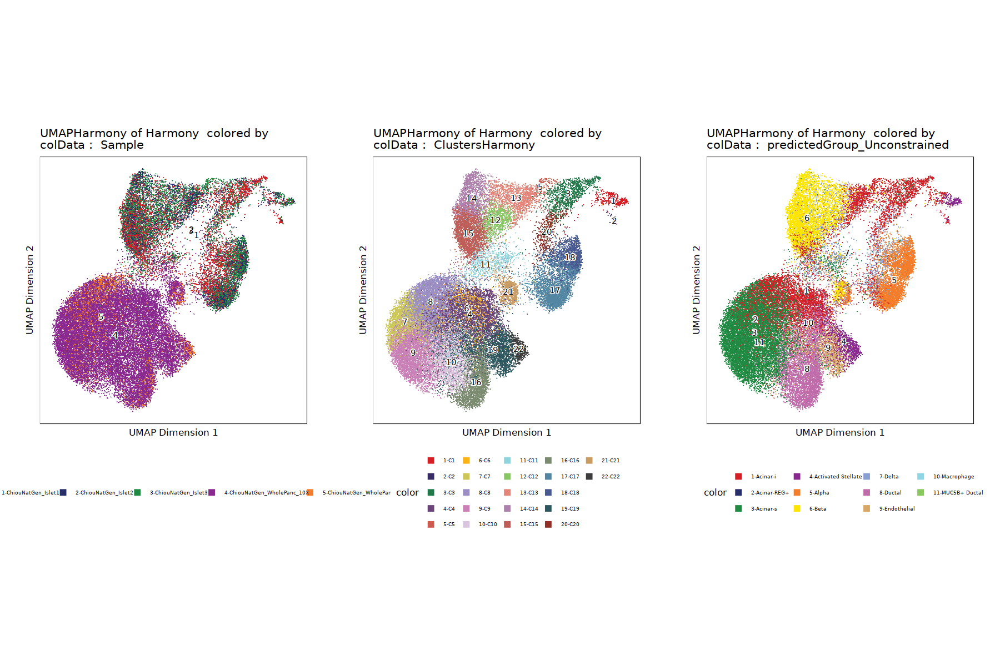

In [ ]:
fig(15,10)
ggAlignPlots(umap3, umap4, umap5, type = "h")

In [ ]:
plotPDF(umap3,umap4,umap5, name = "Plot-UMAP-Harmony-Sample-Clusters-scRNALabelTosti.pdf", ArchRProj = proj, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



In [ ]:
tsne3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "TSNEHarmony") # Sample
tsne4 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "ClustersHarmony", embedding = "TSNEPHarmony") # Clusters
tsne5 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "predictedGroup_Unconstrained", embedding = "TSNEHarmony") # Unconstrained cross-platform linkage

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33877b912eea-Date-2022-05-11_Time-17-12-10.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-33877b912eea-Date-2022-05-11_Time-17-12-10.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-33877c7f7736-Date-2022-05-11_Time-17-12-17.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding



ERROR: Error in getEmbedding(ArchRProj, embedding = embedding, returnDF = TRUE): Embedding not in computed embeddings, Current ones are : UMAP,UMAPHarmony,TSNE,TSNEHarmony


## Save ArchRProject

In [ ]:
saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(21): Sample TSSEnrichment ...
  predictedGroup_Unconstrained predictedScore_Unconstrained
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

## Cell Type Annotation

In [ ]:
MetaData <- proj@cellColData %>% as.data.frame

In [ ]:
str(MetaData)

'data.frame':	40049 obs. of  21 variables:
 $ Sample                      : chr  "ChiouNatGen_WholePanc_10X" "ChiouNatGen_WholePanc_10X" "ChiouNatGen_WholePanc_10X" "ChiouNatGen_WholePanc_10X" ...
 $ TSSEnrichment               : num  4.24 5.52 8.15 5.29 5.89 ...
 $ ReadsInTSS                  : num  4778 7129 9375 4396 3959 ...
 $ ReadsInPromoter             : num  6921 9291 10704 5906 4744 ...
 $ ReadsInBlacklist            : num  722 474 500 393 490 649 478 536 591 549 ...
 $ PromoterRatio               : num  0.0634 0.0903 0.1247 0.072 0.0601 ...
 $ PassQC                      : num  1 1 1 1 1 1 1 1 1 1 ...
 $ NucleosomeRatio             : num  0.594 0.775 1.578 1.084 0.608 ...
 $ nMultiFrags                 : num  4018 4768 4309 2681 1842 ...
 $ nMonoFrags                  : num  34237 28986 16641 19689 24527 ...
 $ nFrags                      : num  54575 51448 42906 41026 39440 ...
 $ nDiFrags                    : num  16320 17694 21956 18656 13071 ...
 $ DoubletScore           

In [ ]:
MetaData$ClustersHarmony %>% str

 chr [1:40049] "C19" "C10" "C10" "C7" "C19" "C10" "C21" "C19" "C7" "C7" ...


In [ ]:
MetaData$ClustersHarmony %>% unique 

[1] "C19" "C10" "C7"  "C21" "C11" "C9"  "C16" "C22" "C8"  "C6"  "C4"  "C14"
[13] "C17" "C18" "C15" "C12" "C3"  "C20" "C5"  "C13" "C1"  "C2"

In [ ]:
library(tidyverse)

In [ ]:
# testing script
# https://en.wikibooks.org/wiki/R_Programming/Text_Processing#Regular_Expressions

TestData <- MetaData %>%
    mutate(cell_type = case_when(
                           grepl("C1$",Clusters) ~ 'test1', # use '$' to avoid the recognition of C10-C19 as a pattern
                           grepl("C2$",Clusters) ~ 'test2',
                           grepl("C3",Clusters) ~ 'test3',
                           grepl("C4",Clusters) ~ 'test4',
                           grepl("C5",Clusters) ~ 'test5',
                           grepl("C6",Clusters) ~ 'test6',
                           grepl("C7",Clusters) ~ 'test7',
                           grepl("C8",Clusters) ~ 'test8',
                           grepl("C9",Clusters) ~ 'test9',
                           grepl("C10",Clusters) ~ 'test10',
                           grepl("C11",Clusters) ~ 'test11',
                           grepl("C12",Clusters) ~ 'test12',
                           grepl("C13",Clusters) ~ 'test13',
                           grepl("C14",Clusters) ~ 'test14',
                           grepl("C15",Clusters) ~ 'test15',
                           grepl("C16",Clusters) ~ 'test16',
                           grepl("C17",Clusters) ~ 'test17',
                           grepl("C18",Clusters) ~ 'test18',
                           grepl("C19",Clusters) ~ 'test19',
                           grepl("C20",Clusters) ~ 'test20',
                           grepl("C21",Clusters) ~ 'test21',
                           grepl("C22",Clusters) ~ 'test22',
        #TRUE ~ 'Immune Cells'
                                                            )
          )

MetaData$ClustersHarmony %>% unique 
TestData$cell_type %>% unique 

[1] "C16" "C19" "C13" "C18" "C12" "C20" "C14" "C17" "C21" "C22" "C15" "C4" 
[13] "C5"  "C9"  "C11" "C10" "C6"  "C3"  "C1"  "C7"  "C8"  "C2"

[1] "test16" "test19" "test13" "test18" "test12" "test20" "test14" "test17"
 [9] "test21" "test22" "test15" "test4"  "test5"  "test9"  "test11" "test10"
[17] "test6"  "test3"  "test1"  "test7"  "test8"  "test2"

In [ ]:
MetaData2 <- MetaData %>%
    mutate(cell_type = case_when(
                           grepl("C1$",ClustersHarmony) ~ 'Stellate Cells', # use '$' to avoid the recognition of C10-C19 as a pattern
                           grepl("C2$",ClustersHarmony) ~ 'Stellate Cells',
                           grepl("C3",ClustersHarmony) ~ 'Unknown Cells',
                           grepl("C4",ClustersHarmony) ~ 'Acinar Cells',
                           grepl("C5",ClustersHarmony) ~ 'Beta_2 Cells',
                           grepl("C6",ClustersHarmony) ~ 'Acinar Cells',
                           grepl("C7",ClustersHarmony) ~ 'Acinar Cells',
                           grepl("C8",ClustersHarmony) ~ 'Acinar Cells',
                           grepl("C9",ClustersHarmony) ~ 'Acinar Cells',
                           grepl("C10",ClustersHarmony) ~ 'Ductal Cells',
                           grepl("C11",ClustersHarmony) ~ 'Delta Cells',
                           grepl("C12",ClustersHarmony) ~ 'Beta_2 Cells',
                           grepl("C13",ClustersHarmony) ~ 'Beta_2 Cells',
                           grepl("C14",ClustersHarmony) ~ 'Beta_1 Cells',
                           grepl("C15",ClustersHarmony) ~ 'Beta_1 Cells',
                           grepl("C16",ClustersHarmony) ~ 'Ductal Cells',
                           grepl("C17",ClustersHarmony) ~ 'Alpha_1 Cells',
                           grepl("C18",ClustersHarmony) ~ 'Alpha_1 Cells',
                           grepl("C19",ClustersHarmony) ~ 'Endothelial Cells',
                           grepl("C20",ClustersHarmony) ~ 'Alpha_2 Cells',
                           grepl("C21",ClustersHarmony) ~ 'Unknown Cells',
                           grepl("C22",ClustersHarmony) ~ 'Stellate Cells'
                                                            ))

In [ ]:
MetaData2$cell_type %>% length

[1] 40049

In [ ]:
MetaData$ClustersHarmony %>% unique 
MetaData2$cell_type %>% unique 

[1] "C19" "C10" "C7"  "C21" "C11" "C9"  "C16" "C22" "C8"  "C6"  "C4"  "C14"
[13] "C17" "C18" "C15" "C12" "C3"  "C20" "C5"  "C13" "C1"  "C2"

[1] "Endothelial Cells" "Ductal Cells"      "Acinar Cells"     
 [4] "Unknown Cells"     "Delta Cells"       "Stellate Cells"   
 [7] "Beta_1 Cells"      "Alpha_1 Cells"     "Beta_2 Cells"     
[10] "Alpha_2 Cells"

In [ ]:
CellTypeData <- MetaData2$cell_type

In [ ]:
proj <- addCellColData(ArchRProj = proj, data = CellTypeData, name = "CellType", cells = proj$cellNames, force = TRUE)

In [ ]:
proj@cellColData %>% str

Formal class 'DFrame' [package "S4Vectors"] with 6 slots
  ..@ rownames       : chr [1:40049] "ChiouNatGen_WholePanc_10X#AACCAACAGACCGCAA-1" "ChiouNatGen_WholePanc_10X#CCCTCTCGTACTAGAA-1" "ChiouNatGen_WholePanc_10X#AATACGCTCGGATAGG-1" "ChiouNatGen_WholePanc_10X#GCACGCACAATGGTCT-1" ...
  ..@ nrows          : int 40049
  ..@ listData       :List of 22
  .. ..$ Sample                      :Formal class 'Rle' [package "S4Vectors"] with 4 slots
  .. .. .. ..@ values         : chr [1:5] "ChiouNatGen_WholePanc_10X" "ChiouNatGen_Islet3" "ChiouNatGen_Islet1" "ChiouNatGen_Islet2" ...
  .. .. .. ..@ lengths        : int [1:5] 23433 5069 4758 3881 2908
  .. .. .. ..@ elementMetadata: NULL
  .. .. .. ..@ metadata       : list()
  .. ..$ TSSEnrichment               : num [1:40049(1d)] 4.24 5.52 8.15 5.29 5.89 ...
  .. ..$ ReadsInTSS                  : num [1:40049(1d)] 4778 7129 9375 4396 3959 ...
  .. ..$ ReadsInPromoter             : num [1:40049(1d)] 6921 9291 10704 5906 4744 ...
  .. ..$ ReadsIn

In [11]:
umap1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "UMAPHarmony")
umap2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "ClustersHarmony", embedding = "UMAPHarmony")
umap3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "CellType", embedding = "UMAPHarmony")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-46a2fd6ee51b-Date-2024-10-25_Time-16-08-26.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-46a2fd6ee51b-Date-2024-10-25_Time-16-08-26.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-46a2f48c4aef-Date-2024-10-25_Time-16-08-46.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-46a2f48c4aef-Date-2024-10-25_Time-16-08-46.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-46a2f147db2b0-Date-2024-10-25_Time-16-08-47.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : Arc

In [12]:
tsne1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "Sample", embedding = "TSNEHarmony")
tsne2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "ClustersHarmony", embedding = "TSNEHarmony")
tsne3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", name = "CellType", embedding = "TSNEHarmony")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-46a2f3ac59152-Date-2024-10-25_Time-16-08-49.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-46a2f3ac59152-Date-2024-10-25_Time-16-08-49.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-46a2f11c296ff-Date-2024-10-25_Time-16-08-49.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-46a2f11c296ff-Date-2024-10-25_Time-16-08-49.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-46a2f617d4189-Date-2024-10-25_Time-16-08-50.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to :

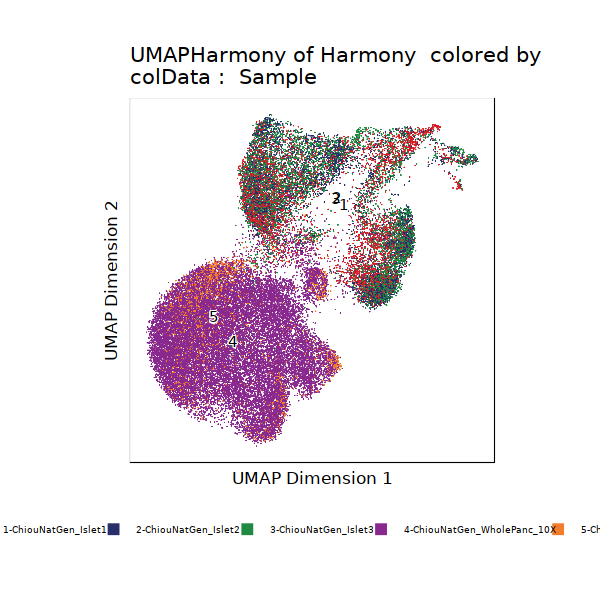

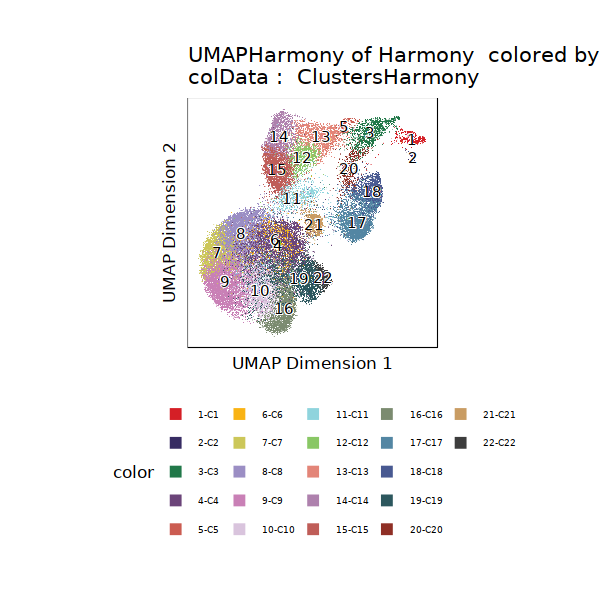

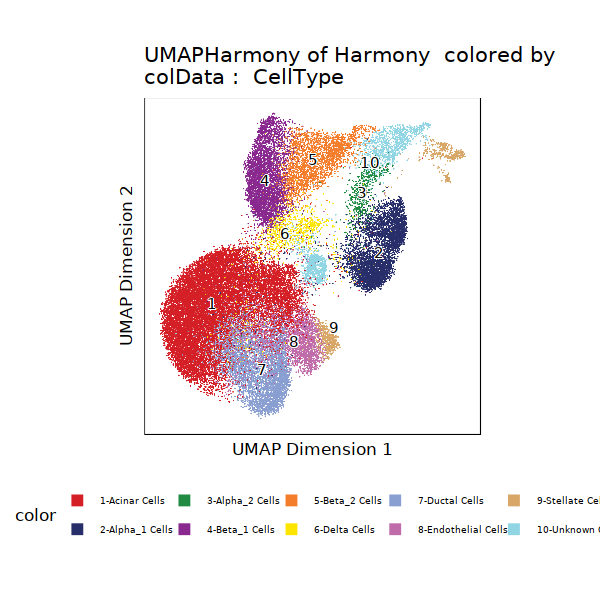

In [13]:
fig(5,5)
umap1
umap2
umap3

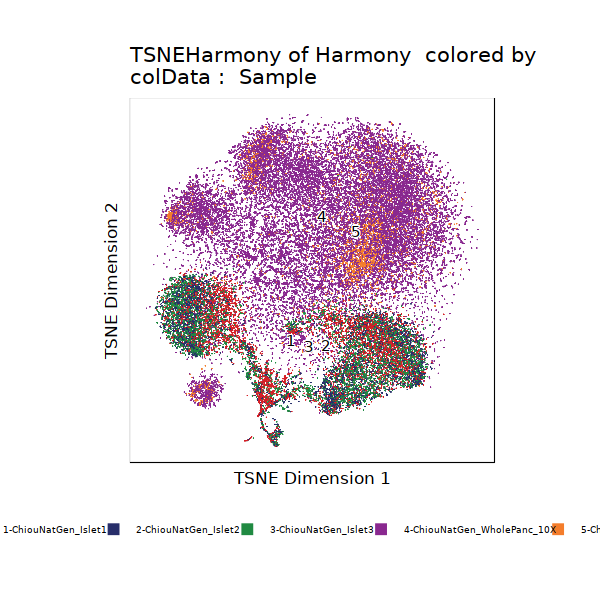

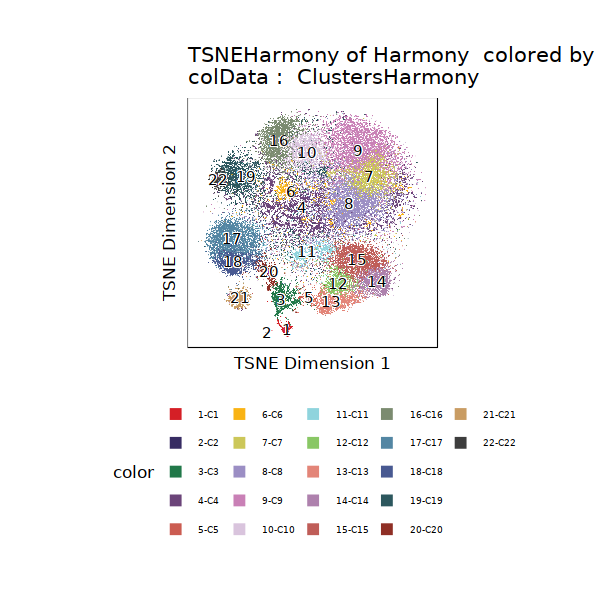

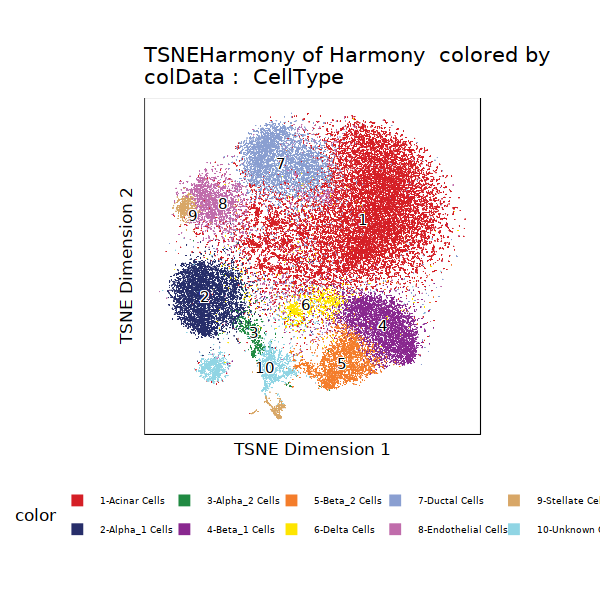

In [14]:
tsne1 
tsne2 
tsne3

In [ ]:
plotPDF(umap3,umap4,umap5,tsne1,tsne2,tsne3, name = "Plot-UMAPTSNE-Harmony-Sample-Clusters-CellType.pdf", ArchRProj = proj, addDOC = FALSE, width = 5, height = 5)

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!

Plotting Ggplot!



In [ ]:
table(proj$CellType)


     Acinar Cells       Alpha Cells        Beta Cells       Delta Cells 
             1255               516              5714               219 
     Ductal Cells Endothelial Cells      Immune Cells    Stellate Cells 
               98               434               176               223 
    Unknown Cells 
             1058 

## Save ArchRProject

In [ ]:
saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         

class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(22): Sample TSSEnrichment ...
  predictedScore_Unconstrained CellType
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

# Peak Calling of pseudo-bulk replicates with MACS2

## Making Pseudo-bulk Replicates

In [ ]:
proj <- addGroupCoverages(ArchRProj = proj, groupBy = "CellType", force = TRUE)

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-20d623dfef90-Date-2022-05-17_Time-12-12-12.log
If there is an issue, please report to github with logFile!

Acinar Cells (1 of 10) : CellGroups N = 3

Alpha_1 Cells (2 of 10) : CellGroups N = 4

Alpha_2 Cells (3 of 10) : CellGroups N = 3

Beta_1 Cells (4 of 10) : CellGroups N = 4

Beta_2 Cells (5 of 10) : CellGroups N = 4

Delta Cells (6 of 10) : CellGroups N = 4

Ductal Cells (7 of 10) : CellGroups N = 2

Endothelial Cells (8 of 10) : CellGroups N = 2

Stellate Cells (9 of 10) : CellGroups N = 5

Unknown Cells (10 of 10) : CellGroups N = 5

2022-05-17 12:12:15 : Creating Coverage Files!, 0.051 mins elapsed.

2022-05-17 12:12:15 : Batch Execution w/ safelapply!, 0.051 mins elapsed.

2022-05-17 12:13:03 : Adding Kmer Bias to Coverage Files!, 0.853 mins elapsed.

Completed Kmer Bias Calculation

Adding Kmer Bias (1 of 36)

Adding Kmer Bias (2 of 36)

Adding Kmer Bias (3 of 36)

Adding Kmer Bias (4 of 36)

Adding Kmer Bias (5 of 36)

Ad

In [ ]:
proj <- addReproduciblePeakSet(
    ArchRProj = proj, 
    groupBy = "CellType", 
    pathToMacs2 = '/data/leuven/332/vsc33293/miniconda/bin/macs2'
)

ArchR logging to : ArchRLogs/ArchR-addReproduciblePeakSet-20d625412e60-Date-2022-05-17_Time-12-14-36.log
If there is an issue, please report to github with logFile!

Calling Peaks with Macs2

2022-05-17 12:14:37 : Peak Calling Parameters!, 0.015 mins elapsed.



                              Group nCells nCellsUsed nReplicates nMin nMax
Acinar Cells           Acinar Cells  16691       1053           3   53  500
Alpha_1 Cells         Alpha_1 Cells   4642       1659           4  159  500
Alpha_2 Cells         Alpha_2 Cells    490        456           3  105  187
Beta_1 Cells           Beta_1 Cells   4307       1658           4  158  500
Beta_2 Cells           Beta_2 Cells   2525       1568           4   68  500
Delta Cells             Delta Cells    992        961           4   85  320
Ductal Cells           Ductal Cells   4755        887           2  387  500
Endothelial Cells Endothelial Cells   2770        608           2  108  500
Stellate Cells       Stellate Cells    947        947           5  125  384
Unknown Cells         Unknown Cells   1930       1587           5  157  500
                  maxPeaks
Acinar Cells        150000
Alpha_1 Cells       150000
Alpha_2 Cells       150000
Beta_1 Cells        150000
Beta_2 Cells        150000
De

2022-05-17 12:14:37 : Batching Peak Calls!, 0.015 mins elapsed.

2022-05-17 12:14:37 : Batch Execution w/ safelapply!, 0 mins elapsed.

2022-05-17 12:17:04 : Identifying Reproducible Peaks!, 2.463 mins elapsed.

2022-05-17 12:17:21 : Creating Union Peak Set!, 2.747 mins elapsed.

Converged after 8 iterations!

Plotting Ggplot!

2022-05-17 12:17:34 : Finished Creating Union Peak Set (209921)!, 2.962 mins elapsed.



In [ ]:
getAvailableMatrices(proj)

[1] "GeneScoreMatrix" "TileMatrix"

In [ ]:
getPeakSet(proj)

GRanges object with 209921 ranges and 13 metadata columns:
                 seqnames              ranges strand |     score
                    <Rle>           <IRanges>  <Rle> | <numeric>
   Alpha_1 Cells     chr1       804700-805200      * |   4.88396
  Stellate Cells     chr1       817126-817626      * |   4.35657
  Stellate Cells     chr1       826566-827066      * |   1.96894
     Delta Cells     chr1       827306-827806      * |  13.26748
   Alpha_1 Cells     chr1       830685-831185      * |   3.49163
             ...      ...                 ...    ... .       ...
   Alpha_1 Cells     chrX 155216659-155217159      * |  37.68867
    Beta_1 Cells     chrX 155264259-155264759      * |  53.91700
    Beta_1 Cells     chrX 155334511-155335011      * |   5.84067
  Stellate Cells     chrX 155612054-155612554      * |   5.87514
     Delta Cells     chrX 155612722-155613222      * |  33.17025
                 replicateScoreQuantile groupScoreQuantile Reproducibility
                     

## Save ArchR Project

In [ ]:
saveArchRProject(ArchRProj = proj, load = FALSE)

Saving ArchRProject...



## Add Peak Matrix

In [ ]:
proj <- addPeakMatrix(proj)

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-20d623621c5e-Date-2022-05-17_Time-12-17-41.log
If there is an issue, please report to github with logFile!

2022-05-17 12:17:41 : Batch Execution w/ safelapply!, 0 mins elapsed.

Overriding previous entry for ReadsInPeaks

Overriding previous entry for FRIP

ArchR logging successful to : ArchRLogs/ArchR-addPeakMatrix-20d623621c5e-Date-2022-05-17_Time-12-17-41.log



In [ ]:
getAvailableMatrices(proj)

[1] "GeneScoreMatrix" "PeakMatrix"      "TileMatrix"

# MetaData Extraction

In [ ]:
proj@cellColData %>% str

Formal class 'DFrame' [package "S4Vectors"] with 6 slots
  ..@ rownames       : chr [1:9693] "scATAC_mm10_Pancreas_CT4#TAGTCCCTCGGCTATA-1" "scATAC_mm10_Pancreas_CT4#TAGGTGTCACCCTTTG-1" "scATAC_mm10_Pancreas_CT4#GCCATAAAGGATGTAT-1" "scATAC_mm10_Pancreas_CT4#CACCTTGCAGCTATAC-1" ...
  ..@ nrows          : int 9693
  ..@ listData       :List of 18
  .. ..$ Sample           :Formal class 'Rle' [package "S4Vectors"] with 4 slots
  .. .. .. ..@ values         : chr [1:3] "scATAC_mm10_Pancreas_CT4" "scATAC_mm10_Pancreas_CT16" "scATAC_mm10_Pancreas_CA"
  .. .. .. ..@ lengths        : int [1:3] 4922 3164 1607
  .. .. .. ..@ elementMetadata: NULL
  .. .. .. ..@ metadata       : list()
  .. ..$ nMultiFrags      : num [1:9693(1d)] 15964 12251 10622 8223 7849 ...
  .. ..$ nMonoFrags       : num [1:9693(1d)] 38298 33400 29963 31476 27317 ...
  .. ..$ nFrags           : num [1:9693(1d)] 87909 76288 72965 72638 69251 ...
  .. ..$ nDiFrags         : num [1:9693(1d)] 33647 30637 32380 32939 34085 ...
  .

# Generate Peak Barcode Matrix

## Library

In [ ]:
library(Signac)
library(Seurat)
library(GenomeInfoDb)
library(EnsDb.Mmusculus.v79)
library(ggplot2)
library(patchwork)
set.seed(1234)
library(tidyverse)

library(JASPAR2020)
library(BSgenome.Mmusculus.UCSC.mm10)

Attaching SeuratObject


Attaching package: ‘Seurat’


The following object is masked from ‘package:SummarizedExperiment’:

    Assays


Loading required package: ensembldb

Loading required package: GenomicFeatures

Loading required package: AnnotationDbi


Attaching package: ‘AnnotationDbi’


The following object is masked from ‘package:dplyr’:

    select


Loading required package: AnnotationFilter


Attaching package: ‘AnnotationFilter’


The following object is masked from ‘package:magrittr’:

    not



Attaching package: 'ensembldb'


The following object is masked from 'package:dplyr':

    filter


The following object is masked from 'package:stats':

    filter


Loading required package: BSgenome

Loading required package: Biostrings

Loading required package: XVector


Attaching package: 'XVector'


The following object is masked from 'package:purrr':

    compact



Attaching package: 'Biostrings'


The following object is masked from 'package:base':

    strsplit


Loadi

In [ ]:
# Directories
ProjectDir <- '/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/'

ChiouNatGen_T2D <- paste0(ProjectDir, "Chiou.et.al.2021_NatureGenetics_T2D/")
ChiouNatGen_T2D_DATA_Dir <- paste0(ChiouNatGen_T2D, "OUTPUTDIR/")


RDS_Dir <- paste0(ProjectDir, "RDS/")
FIG_Dir <- paste0(ProjectDir, "Figure/")
DATA_Dir <- paste0(ProjectDir, "Data/")

In [ ]:
# Input fragment files
pathToPancreasIslet1 <- paste0(ChiouNatGen_T2D_DATA_Dir, 'SRR12957013/')
pathToPancreasIslet2 <- paste0(ChiouNatGen_T2D_DATA_Dir, 'SRR12957014/')
pathToPancreasIslet3 <- paste0(ChiouNatGen_T2D_DATA_Dir, 'SRR12957015/')
pathToWholePancreas_CB <- paste0(ChiouNatGen_T2D_DATA_Dir, 'SRR12957016/')
pathToWholePancreas_10X <- paste0(ChiouNatGen_T2D_DATA_Dir, 'ChiouNatGen_WholePancreas/outs/')

scATACHg38PancreasIslet1 <- paste0(pathToPancreasIslet1, 'fragments.sort.bed.gz')
scATACHg38PancreasIslet2 <- paste0(pathToPancreasIslet2, 'fragments.sort.bed.gz')
scATACHg38PancreasIslet3 <- paste0(pathToPancreasIslet3, 'fragments.sort.bed.gz')
scATACHg38WholePancreas_CB <- paste0(pathToWholePancreas_CB, 'fragments.sort.bed.gz')
scATACHg38WholePancreas_10X <- paste0(pathToWholePancreas_10X, 'fragments.tsv.gz')

## Peak Barcode Matrix Generation

In [ ]:
proj


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/ArchR_TSSen10 
samples(5): ChiouNatGen_WholePanc_10X ChiouNatGen_Islet3
  ChiouNatGen_Islet1 ChiouNatGen_Islet2 ChiouNatGen_WholePanc_CB
sampleColData names(1): ArrowFiles
cellColData names(24): Sample TSSEnrichment ... ReadsInPeaks FRIP
numberOfCells(1): 40049
medianTSS(1): 13.433
medianFrags(1): 2684

In [ ]:
#Collect cell names of high-quality cells in ArchRProject

ListCellPancreasWhole10X <- proj@cellColData %>% row.names %>% str_subset("ChiouNatGen_WholePanc_10X#") %>% str_replace("ChiouNatGen_WholePanc_10X#", "")
ListCellPancreasWholeCB <- proj@cellColData %>% row.names %>% str_subset("ChiouNatGen_WholePanc_CB#") %>% str_replace("ChiouNatGen_WholePanc_CB#", "")
ListCellPancreasIslet1 <- proj@cellColData %>% row.names %>% str_subset("ChiouNatGen_Islet1#") %>% str_replace("ChiouNatGen_Islet1#", "")
ListCellPancreasIslet2 <- proj@cellColData %>% row.names %>% str_subset("ChiouNatGen_Islet2#") %>% str_replace("ChiouNatGen_Islet2#", "")
ListCellPancreasIslet3 <- proj@cellColData %>% row.names %>% str_subset("ChiouNatGen_Islet3#") %>% str_replace("ChiouNatGen_Islet3#", "")



In [ ]:
ListCellPancreasWhole10X %>% length
ListCellPancreasWholeCB %>% length
ListCellPancreasIslet1 %>% length
ListCellPancreasIslet2 %>% length
ListCellPancreasIslet3 %>% length

[1] 23433

[1] 2908

[1] 4758

[1] 3881

[1] 5069

## Create and Save Peak Barcode Matrix

In [ ]:
fragments <- scATACHg38PancreasIslet1
ListCellPancreas <- ListCellPancreasIslet1
Peakset <- getPeakSet(proj) 

atac.frags <- CreateFragmentObject(path = fragments, cells = ListCellPancreas)

counts <- FeatureMatrix(
  fragments = atac.frags,
  features = Peakset,
  cells = ListCellPancreas
)

write.csv(counts, paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Islet1"))

Computing hash

Extracting reads overlapping genomic regions



In [ ]:
fragments <- scATACHg38PancreasIslet2
ListCellPancreas <- ListCellPancreasIslet2
Peakset <- getPeakSet(proj) 

atac.frags <- CreateFragmentObject(path = fragments, cells = ListCellPancreas)

counts <- FeatureMatrix(
  fragments = atac.frags,
  features = Peakset,
  cells = ListCellPancreas
)

write.csv(counts, paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Islet2"))

Computing hash

Extracting reads overlapping genomic regions



In [ ]:
fragments <- scATACHg38PancreasIslet3
ListCellPancreas <- ListCellPancreasIslet3
Peakset <- getPeakSet(proj) 

atac.frags <- CreateFragmentObject(path = fragments, cells = ListCellPancreas)

counts <- FeatureMatrix(
  fragments = atac.frags,
  features = Peakset,
  cells = ListCellPancreas
)

write.csv(counts, paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Islet3"))

Computing hash

Extracting reads overlapping genomic regions



In [ ]:
fragments <- scATACHg38WholePancreas_CB
ListCellPancreas <- ListCellPancreasWholeCB
Peakset <- getPeakSet(proj) 

atac.frags <- CreateFragmentObject(path = fragments, cells = ListCellPancreas)

counts <- FeatureMatrix(
  fragments = atac.frags,
  features = Peakset,
  cells = ListCellPancreas
)

write.csv(counts, paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_WholeCB"))

Computing hash

Extracting reads overlapping genomic regions



### This is not feasible for 10x data from the whole pancreas as the data is too big

In [ ]:
# save sparse matrix
sparse.counts <- Matrix(counts , sparse = T )
head(sparse.counts)
## Market Exchange Format (MEX) format
writeMM(obj = sparse.counts, file=paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X.mtx"))

# save genes and cells names
write(x = rownames(counts), file = paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X_regions.tsv"))
write(x = colnames(counts), file = paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X_barcodes.tsv"))


   [[ suppressing 34 column names 'AACCAACAGACCGCAA-1', 'CCCTCTCGTACTAGAA-1', 'AATACGCTCGGATAGG-1' ... ]]



6 x 23433 sparse Matrix of class "dgCMatrix"
                                                                              
chr1-804700-805200 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-817126-817626 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-826566-827066 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-827306-827806 . . . 1 . . . . . . . . . . . . . . 1 . . . . 1 . . . . . .
chr1-830685-831185 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
chr1-831558-832058 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                 
chr1-804700-805200 . . . . ......
chr1-817126-817626 . . . . ......
chr1-826566-827066 . . . . ......
chr1-827306-827806 . . 1 . ......
chr1-830685-831185 . . . . ......
chr1-831558-832058 . . . . ......

 .....suppressing 23399 columns in show(); maybe adjust 'options(max.print= *, width = *)'
 ..............................

NULL

In [ ]:
Regions <- readr::read_tsv(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X_regions.tsv"),col_names = F) %>% tidyr::unite(region)
Barcodes <- readr::read_tsv(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X_barcodes.tsv"),col_names = F) %>% tidyr::unite(barcode)

Rows: 209921 Columns: 1
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 23433 Columns: 1
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (1): X1

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [ ]:
mtx <- Matrix::readMM(paste0(DATA_Dir,"PeakBCMatrix_","ChiouNatGen_Whole10X.mtx")) %>%
  magrittr::set_colnames(Barcodes$barcode) %>%
  magrittr::set_rownames(Regions$region)

In [ ]:
mtx

# Extract Accessible regions to BED-file

In [ ]:
proj %>% str(max.level = 3
            )

Formal class 'ArchRProject' [package "ArchR"] with 13 slots
  ..@ projectMetadata :Formal class 'SimpleList' [package "S4Vectors"] with 4 slots
  ..@ projectSummary  :Formal class 'SimpleList' [package "S4Vectors"] with 4 slots
  ..@ sampleColData   :Formal class 'DFrame' [package "S4Vectors"] with 6 slots
  ..@ sampleMetadata  :Formal class 'SimpleList' [package "S4Vectors"] with 4 slots
  ..@ cellColData     :Formal class 'DFrame' [package "S4Vectors"] with 6 slots
  ..@ cellMetadata    :Formal class 'SimpleList' [package "S4Vectors"] with 4 slots
  ..@ reducedDims     :Formal class 'SimpleList' [package "S4Vectors"] with 4 slots
  ..@ embeddings      :Formal class 'SimpleList' [package "S4Vectors"] with 4 slots
  ..@ peakSet         :Formal class 'GRanges' [package "GenomicRanges"] with 7 slots
  ..@ peakAnnotation  :Formal class 'SimpleList' [package "S4Vectors"] with 4 slots
  ..@ geneAnnotation  :Formal class 'SimpleList' [package "S4Vectors"] with 4 slots
  ..@ genomeAnnotation:

In [ ]:
proj@genomeAnnotation$genome

[1] "BSgenome.Hsapiens.UCSC.hg38"

In [ ]:
proj@peakSet$idx

[1]     1     2     3     4     5     6     7     8     9    10    11    12
   [13]    13    14    15    16    17    18    19    20    21    22    23    24
   [25]    25    26    27    28    29    30    31    32    33    34    35    36
   [37]    37    38    39    40    41    42    43    44    45    46    47    48
   [49]    49    50    51    52    53    54    55    56    57    58    59    60
   [61]    61    62    63    64    65    66    67    68    69    70    71    72
   [73]    73    74    75    76    77    78    79    80    81    82    83    84
   [85]    85    86    87    88    89    90    91    92    93    94    95    96
   [97]    97    98    99   100   101   102   103   104   105   106   107   108
  [109]   109   110   111   112   113   114   115   116   117   118   119   120
  [121]   121   122   123   124   125   126   127   128   129   130   131   132
  [133]   133   134   135   136   137   138   139   140   141   142   143   144
  [145]   145   146   147   148   149   150   151   152   153   154   155   156
  [157]   157   158   159   160   161   162   163   164   165   166   167   168
  [169]   169   170   171   172   173   174   175   176   177   178   179   180
  [181]   181   182   183   184   185   186   187   188   189   190   191   192
  [193]   193   194   195   196   197   198   199   200   201   202   203   204
  [205]   205   206   207   208   209   210   211   212   213   214   215   216
  [217]   217   218   219   220   221   222   223   224   225   226   227   228
  [229]   229   230   231   232   233   234   235   236   237   238   239   240
  [241]   241   242   243   244   245   246   247   248   249   250   251   252
  [253]   253   254   255   256   257   258   259   260   261   262   263   264
  [265]   265   266   267   268   269   270   271   272   273   274   275   276
  [277]   277   278   279   280   281   282   283   284   285   286   287   288
  [289]   289   290   291   292   293   294   295   296   297   298   299   300
  [301]   301   302   303   304   305   306   307   308   309   310   311   312
  [313]   313   314   315   316   317   318   319   320   321   322   323   324
  [325]   325   326   327   328   329   330   331   332   333   334   335   336
  [337]   337   338   339   340   341   342   343   344   345   346   347   348
  [349]   349   350   351   352   353   354   355   356   357   358   359   360
  [361]   361   362   363   364   365   366   367   368   369   370   371   372
  [373]   373   374   375   376   377   378   379   380   381   382   383   384
  [385]   385   386   387   388   389   390   391   392   393   394   395   396
  [397]   397   398   399   400   401   402   403   404   405   406   407   408
  [409]   409   410   411   412   413   414   415   416   417   418   419   420
  [421]   421   422   423   424   425   426   427   428   429   430   431   432
  [433]   433   434   435   436   437   438   439   440   441   442   443   444
  [445]   445   446   447   448   449   450   451   452   453   454   455   456
  [457]   457   458   459   460   461   462   463   464   465   466   467   468
  [469]   469   470   471   472   473   474   475   476   477   478   479   480
  [481]   481   482   483   484   485   486   487   488   489   490   491   492
  [493]   493   494   495   496   497   498   499   500   501   502   503   504
  [505]   505   506   507   508   509   510   511   512   513   514   515   516
  [517]   517   518   519   520   521   522   523   524   525   526   527   528
  [529]   529   530   531   532   533   534   535   536   537   538   539   540
  [541]   541   542   543   544   545   546   547   548   549   550   551   552
  [553]   553   554   555   556   557   558   559   560   561   562   563   564
  [565]   565   566   567   568   569   570   571   572   573   574   575   576
  [577]   577   578   579   580   581   582   583   584   585   586   587   588
  [589]   589   590   591   592   593   594   595   596   597   598   599   600
  [6

In [ ]:
Peakset <- getPeakSet(proj) 
Peakset %>% head

In [ ]:
# Load the library
library(GenomicRanges)

# Extract the necessary data from the GRanges object
bed_data <- data.frame(seqnames = as.character(seqnames(proj@peakSet)),
                       start = start(proj@peakSet),
                       end = end(proj@peakSet),
                       cell_type = as.character(ranges(proj@peakSet)@NAMES),
                       peak_type = as.character(elementMetadata(proj@peakSet)$peakType)                                               
                                               )

bed_data$region <- paste(1:nrow(bed_data))



bed_data %>% head
# Write the data to a BED file
write.table(bed_data, file =paste0(DATA_Dir, "Hg38PancreasRegions.bed"), sep = "\t", row.names = FALSE, quote = FALSE, col.names = FALSE)


,seqnames,start,end,cell_type,peak_type,region
,<chr>,<int>,<int>,<chr>,<chr>,<chr>
1,chr1,804700,805200,Alpha_1 Cells,Distal,1
2,chr1,817126,817626,Stellate Cells,Promoter,2
3,chr1,826566,827066,Stellate Cells,Exonic,3
4,chr1,827306,827806,Delta Cells,Promoter,4
5,chr1,830685,831185,Alpha_1 Cells,Intronic,5
6,chr1,831558,832058,Beta_2 Cells,Intronic,6


In [ ]:
DATA_Dir

[1] "/lustre1/project/stg_00041/SanKit/SKT012_Chiou_snATAC_Pancreas/Data/"